In [2]:
# standard imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#import pygmt
from pyproj import Proj, Geod
from osgeo import gdal
import pygmt
import rioxarray

import sys
sys.path.append('/Users/chanagan/Documents/GitHub/ImageryResources/Functions/')
import TiffTools as tt

# reload modules when changed
%reload_ext autoreload
%autoreload 2

In [ ]:
whole_region = [-118.9333,-116.8023,34.6753,35.7367]
w_inset_region = [-118.80343,-118.6959,34.84839,34.92569]
w_inset = [-118.775, -118.76, 34.879, 34.89]
e_inset_region = [-117.0256160 ,-116.899990,35.559928,35.6439349]
e_inset = [-117.02, -117, 35.594, 35.61]

small_region = [-118.7642449,-118.69554240695602,34.847426579652385,34.926542]


grid = pygmt.datasets.load_earth_relief(
    resolution='03s',
    region=whole_region,
    use_srtm=True)

dgrid = pygmt.grdgradient(grid=grid, radiance=[315, 60])

P = Proj('epsg:32611')
G = Geod(ellps='WGS84')


: 

In [ ]:
# Subfigures with the predeformed orthomosaics
# Introductory figure base
fig = pygmt.Figure()

# Plot the base map of the main figure. 
fig.basemap(region=w_inset, projection="M3.5c", frame=["wsen"])

# Orthophoto
#pygmt.makecpt(cmap="gray", series=[0,750, 1])
im = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/Planet/20250325_182334_34_24c2_3B_Visual.tif')
im = im.rio.reproject("EPSG:4326")
fig.grdimage(grid=im)
fig.show()

grdimage [WARNING]: (w - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdimage [WARNING]: w reset from -118.775 to -118.775028615
grdimage [WARNING]: (e - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdimage [WARNING]: e reset from -118.76 to -118.759976474
grdimage [WARNING]: (s - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdimage [WARNING]: s reset from 34.879 to 34.8789948605
grdimage [WARNING]: (n - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdimage [WARNING]: n reset from 34.89 to 34.890012407


# Overview

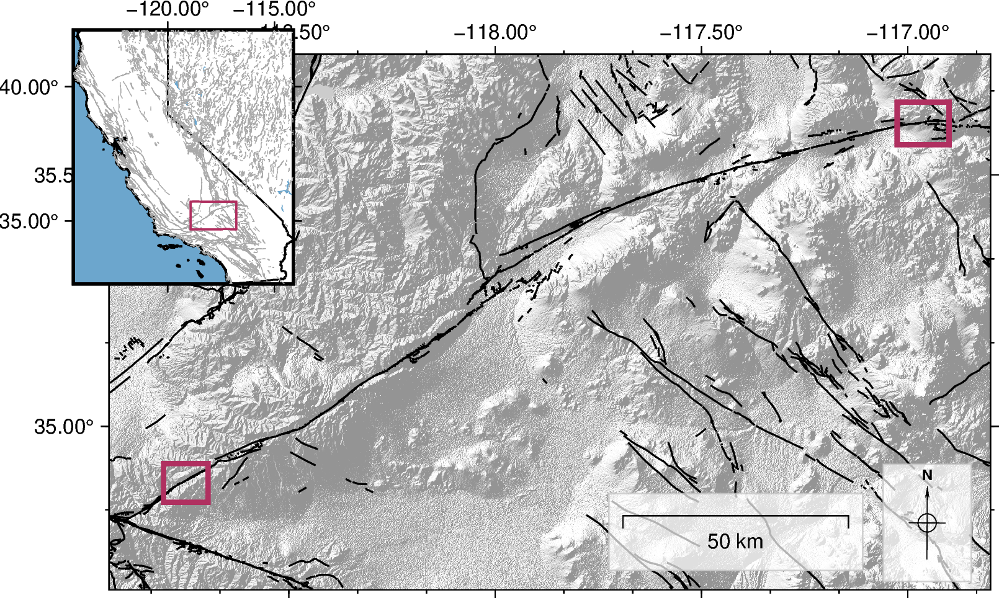

In [85]:
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="6p")

# Plot the base map of the main figure. 
fig.basemap(region=whole_region, projection="M12c", frame=["WNse", "af"])

# Hillshade
pygmt.makecpt(cmap="gray", series=[-2.7, 0.3, 0.01],transparency=60)
fig.grdimage(grid=dgrid, cmap=True)


# Plot a rectangle ("r") in the inset map to show the area of the main
# figure. "+s" means that the first two columns are the longitude and
# latitude of the bottom left corner of the rectangle, and the last two
# columns the longitude and latitude of the upper right corner.
fig.plot(data='/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Data/Qfaults_GIS/SHP/Qfaults_US_Database.shp', pen="0.6p,black")
rectangle = [[e_inset_region[0], e_inset_region[2], e_inset_region[1], e_inset_region[3]]]
fig.plot(data=rectangle, style="r+s", pen="2p,maroon")
rectangle = [[w_inset_region[0], w_inset_region[2], w_inset_region[1], w_inset_region[3]]]
fig.plot(data=rectangle, style="r+s", pen="2p,maroon")

fig.basemap(map_scale='JBR+w50k+o-5c/-1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.6/0.4+w1c')

# Create an inset map, placing it in the Bottom Right (BR) corner with x- and
# y-offsets of 0.1 cm, respectively.
# The inset map contains the Japan main land. "U54S/3c" means UTM projection
# with a map width of 3 cm. The inset width and height are automatically
# calculated from the specified ``region`` and ``projection`` parameters.
# Draws a rectangular box around the inset with a fill color of "white" and
# a pen of "1p".
with fig.inset(
    position="jTL+o-1.5c/-1.5c",
    margin='1c',
    region='US.CA',
    projection="M5c",
):
    fig.coast(
        region='US.CA',
        dcw="US.CA+p0.6p,black+gwhite",
        land='white',
        borders='1',
        water='skyblue3',
        frame=["WNse", "a"],
    )
    rectangle = [[whole_region[0], whole_region[2], whole_region[1], whole_region[3]]]
    fig.plot(data='/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Data/Qfaults_GIS/SHP/Qfaults_US_Database.shp', pen="0.2p,darkgrey")
    fig.plot(data=rectangle,style="r+s", pen="0.7p,black")
#fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/GarlockIntroMap.pdf',dpi=300)

fig.show()


In [13]:
# Load dem for small west region
image = rioxarray.open_rasterio('/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/2019GarlockWestDEM-cropped.tif')
im1_lonlat = image.rio.reproject("EPSG:4326")
dgrid = pygmt.grdgradient(grid=im1_lonlat, radiance=[270, 30])

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdgradient.py:170: RuntimeWarning: Input image has dtype: float32 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


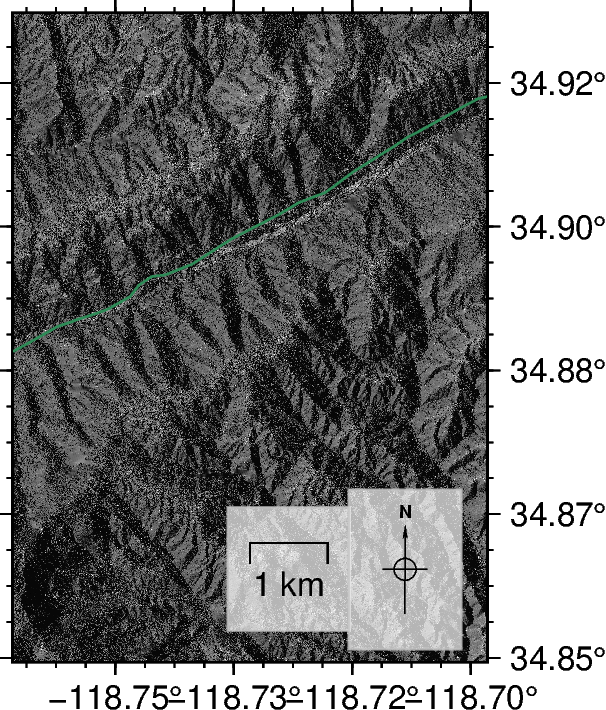

In [16]:

# Subfigures with the predeformed orthomosaics
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="6p")

# Plot the base map of the main figure. 
fig.basemap(region=small_region, projection="M4c", frame=["ESnw", "af"])

# DEM
pygmt.makecpt(cmap="gray", series=[-1, 0.75, 0.01],transparency=60)
fig.grdimage(grid=dgrid,cmap=True)
# Fault
pts = pd.read_csv('/Volumes/Extreme Pro/Projects/Garlock/GIS/WestPoints.csv')
pts['id'] = pts.index
# Project to UTM
pts['x'], pts['y'] = pts.Lon, pts.Lat
pts.dropna(inplace=True)
pts['Lon'] = P(pts['x'],pts['y'],inverse=True)[0]
pts['Lat'] = P(pts['x'],pts['y'],inverse=True)[1]
pts.sort_values(by='Lon',ascending=True,inplace=True)
fig.plot(x=pts.Lon,y=pts.Lat,pen="0.5p,seagreen")

fig.basemap(map_scale='JBR+w1k+o-2c/-1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.5/0.4+w0.75c')
fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/GarlockWDEMSmallRegion.pdf',dpi=300)
fig.show()

# East and West Orthophotos

In [5]:
# Load ortho
image = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/East/micmac/20APR28214017-P1BS_R3C1-merged-f32.tif')
im1_lonlat = image.rio.reproject("EPSG:4326")
# Load ortho
image = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/West/micmac/19JUL26214314-P1BS-merged-f32.tif')
im2_lonlat = image.rio.reproject("EPSG:4326")


/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float32 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


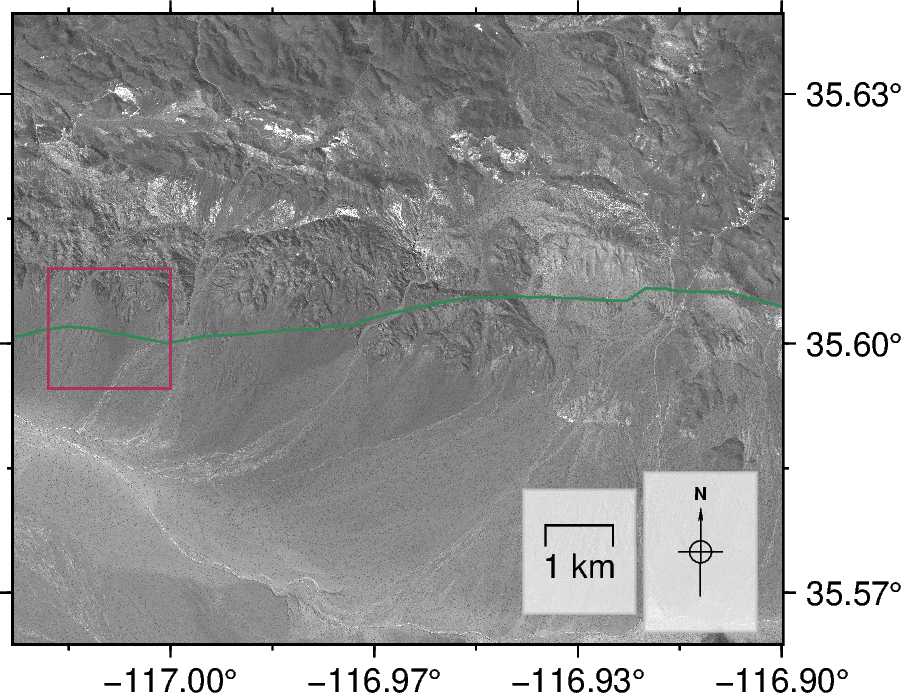

In [22]:
# Subfigures with the predeformed orthomosaics
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="6p")

# Plot the base map of the main figure. 
fig.basemap(region=e_inset_region, projection="M6.5c", frame=["ESnw", "af"])

# Orthophoto
pygmt.makecpt(cmap="gray", series=[0,750, 1])
fig.grdimage(grid=im1_lonlat,cmap=True)
# Fault Trace
pts = pd.read_csv('/Volumes/Extreme Pro/Projects/Garlock/GIS/EastPoints.csv')
pts.sort_values(by='Lon',ascending=True,inplace=True)
fig.plot(x=pts.Lon,y=pts.Lat,pen="0.5p,darkgreen")

rectangle = [[e_inset[0], e_inset[2], e_inset[1], e_inset[3]]]
fig.plot(data=rectangle, style="r+s", pen="0.55p,maroon")


fig.basemap(map_scale='JBR+w1k+o-2c/-1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.5/0.4+w0.75c')
#fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/GarlockEInset.pdf',dpi=300)
fig.show()


In [ ]:
#!gdalwarp -t_srs EPSG:4326 /Volumes/ProjectsGarlockCSAF/Garlock/Planet/20250325_182334_34_24c2_3B_Visual.tif /Volumes/ProjectsGarlockCSAF/Garlock/Planet/20250325_182334_34_24c2_3B_VisualEPSG4326.tif

Using band 4 of source image as alpha.
Creating output file that is 11220P x 6825L.
Processing /Volumes/ProjectsGarlockCSAF/Garlock/Planet/20250325_182334_34_24c2_3B_Visual.tif [1/1] : 0...10...20...30...40...50...60...70...80...90...100 - done.


grdimage [WARNING]: (e - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdimage [WARNING]: e reset from -477 to -476.999970096
grdimage [WARNING]: (s - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdimage [WARNING]: s reset from 35.594 to 35.5939870755
grdimage (gmtapi_import_image): Could not reallocate memory [16995013471.09 Gb, 18248256763353102608 items of 1 bytes]
[Session pygmt-session (64)]: Error returned from GMT API: GMT_MEMORY_ERROR (25)
[Session pygmt-session (64)]: Error returned from GMT API: GMT_MEMORY_ERROR (25)


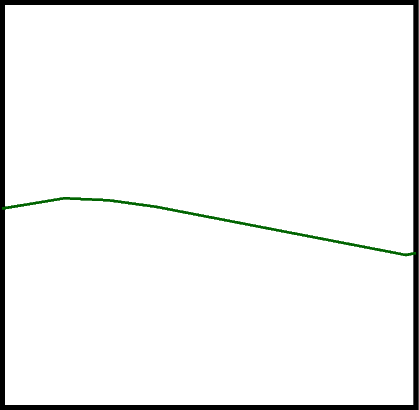

In [ ]:
# Subfigures with the predeformed orthomosaics
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="6p")

# Plot the base map of the main figure. 
fig.basemap(region=e_inset, projection="M3.5c", frame=["esnw"])

# Orthophoto
#pygmt.makecpt(cmap="gray", series=[0,750, 1])
fig.grdimage(grid=)#,cmap=True)
pts = pd.read_csv('/Volumes/ProjectsGarlockCSAF/Garlock/GIS/EastPoints.csv')
pts.sort_values(by='Lon',ascending=True,inplace=True)
fig.plot(x=pts.Lon,y=pts.Lat,pen="0.5p,darkgreen")

#fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/GarlockEInsetZoom.pdf',dpi=300)
fig.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float32 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


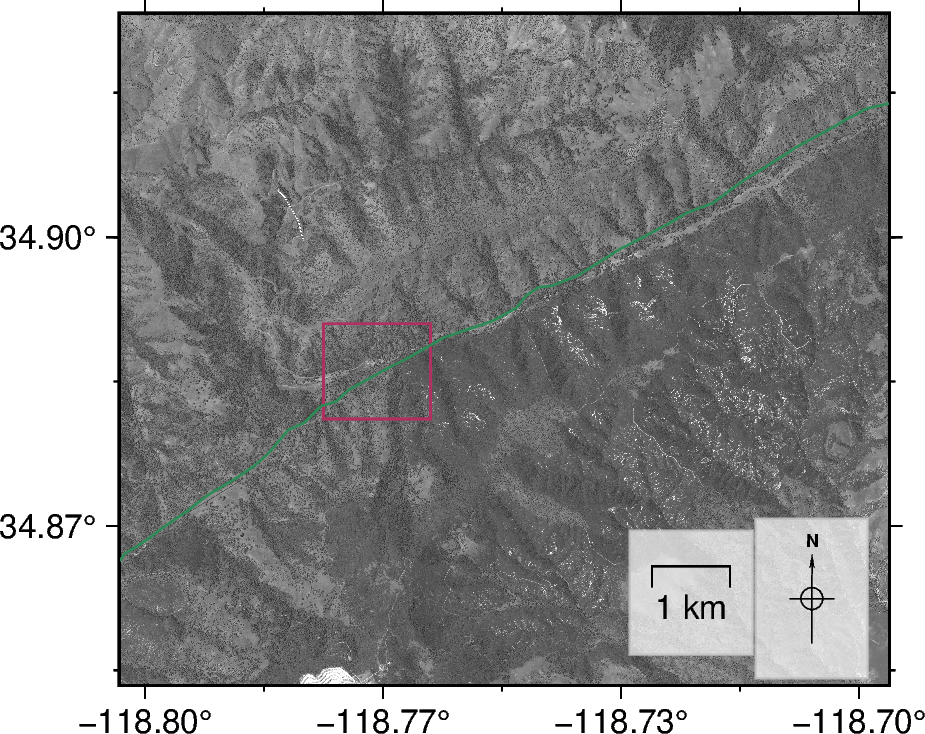

In [ ]:
# Subfigures with the predeformed orthomosaics
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="6p")

# Plot the base map of the main figure. 
fig.basemap(region=w_inset_region, projection="M6.5c", frame=["WSen", "af"])

# Orthophoto
pygmt.makecpt(cmap="gray", series=[0,750, 1])
fig.grdimage(grid=im2_lonlat,cmap=True)

# Inset of inset
rectangle = [[w_inset[0], w_inset[2], w_inset[1], w_inset[3]]]
fig.plot(data=rectangle, style="r+s", pen="0.55p,maroon")

# Fault
pts = pd.read_csv('/Volumes/ProjectsGarlockCSAF/Garlock/GIS/WestPoints.csv')
pts['id'] = pts.index
# Project to UTM
pts['x'], pts['y'] = pts.Lon, pts.Lat
pts.dropna(inplace=True)
pts['Lon'] = P(pts['x'],pts['y'],inverse=True)[0]
pts['Lat'] = P(pts['x'],pts['y'],inverse=True)[1]
pts.sort_values(by='Lon',ascending=True,inplace=True)
fig.plot(x=pts.Lon,y=pts.Lat,pen="0.5p,seagreen")

fig.basemap(map_scale='JBR+w1k+o-2c/-1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.46/0.35+w0.75c')
fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/GarlockWInset.pdf',dpi=300)

fig.show()

In [3]:
# Subfigures with the predeformed orthomosaics
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="6p")

# Plot the base map of the main figure. 
fig.basemap(region=w_inset, projection="M3.5c", frame=["wsen"])

# Orthophoto
#pygmt.makecpt(cmap="gray", series=[0,750, 1])
im = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/Planet/20250325_182334_34_24c2_3B_VisualEPSG4326.tif')
fig.grdimage(grid=im)

# Fault
pts = pd.read_csv('/Volumes/ProjectsGarlockCSAF/Garlock/GIS/WestPoints.csv')
pts['id'] = pts.index
# Project to UTM
pts['x'], pts['y'] = pts.Lon, pts.Lat
pts.dropna(inplace=True)
pts['Lon'] = P(pts['x'],pts['y'],inverse=True)[0]
pts['Lat'] = P(pts['x'],pts['y'],inverse=True)[1]
pts.sort_values(by='Lon',ascending=True,inplace=True)
fig.plot(x=pts.Lon,y=pts.Lat,pen="0.5p,darkgreen")

fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/GarlockWInsetZoom.pdf',dpi=300)

fig.show()

grdimage [WARNING]: (w - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdimage [WARNING]: w reset from -118.775 to -118.775028615
grdimage [WARNING]: (e - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdimage [WARNING]: e reset from -118.76 to -118.759976474
grdimage [WARNING]: (s - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdimage [WARNING]: s reset from 34.879 to 34.8789948605
grdimage [WARNING]: (n - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdimage [WARNING]: n reset from 34.89 to 34.890012407


: 

## DEMs and Land Cover Classification maps

In [3]:
# Load dems and landcover
image = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/West/micmac/2019GarlockWestDEM-cropped.tif')
im1_lonlat = image.rio.reproject("EPSG:4326")
image = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/East/micmac/2020GarlockEastDEM-cropped-f32.tif')
im2_lonlat = image.rio.reproject("EPSG:4326")
image = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/ESA_WORLDCOVER_10M_2021_V200/ESA_WorldCover_clippedGarlockWestAOI_10m.tif')
im3_lonlat = image.rio.reproject("EPSG:4326")
image = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/ESA_WORLDCOVER_10M_2021_V200/ESA_WorldCover_clippedGarlockEastAOI_10m.tif')
im4_lonlat = image.rio.reproject("EPSG:4326")

In [8]:
start = np.array([[-116.9931157 ,   35.60553312],
       [-116.97135834,   35.60688887],
       [-116.92834215,   35.60941675],
       [-118.79006589,   34.87605734],
       [-118.75378223,   34.89435111],
       [-118.7176891 ,   34.91107159]])
end = np.array([[-116.99253034,   35.59653287],
       [-116.9707177 ,   35.59789113],
       [-116.92199215,   35.60204517],
       [-118.78393797,   34.86859096],
       [-118.74843581,   34.8864869 ],
       [-118.71193608,   34.90340409]])


/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float32 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


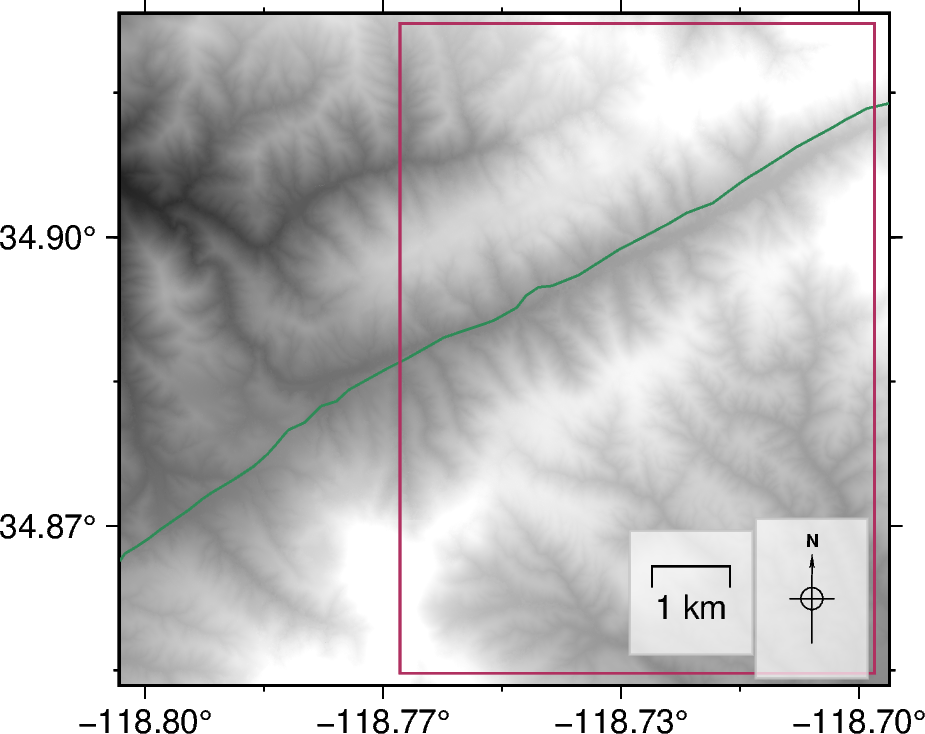

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float32 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


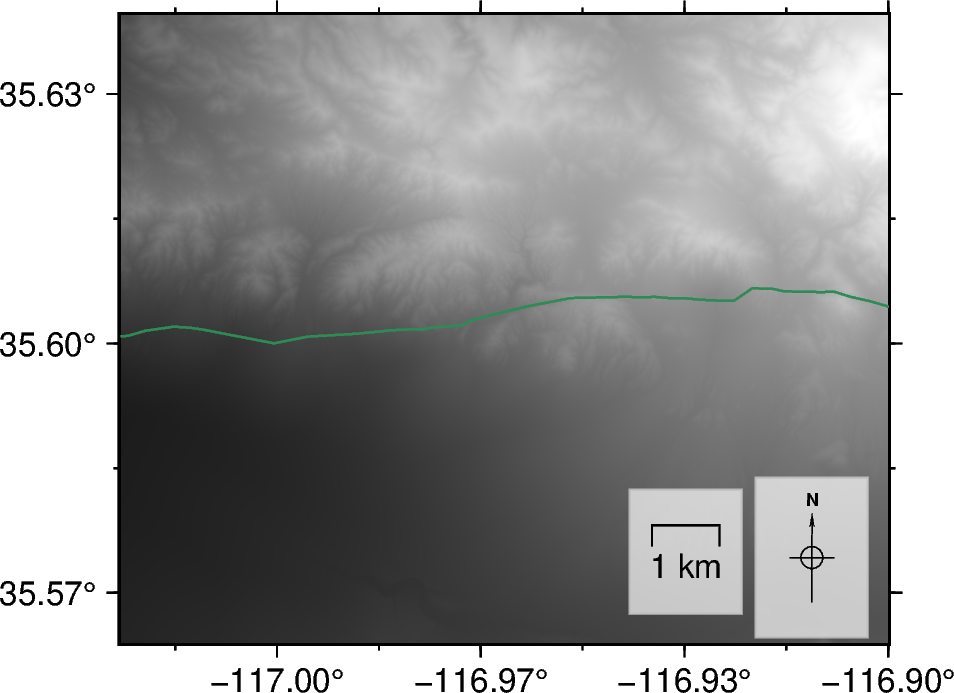

In [6]:
# Define the region and grid for each subplot
region = [w_inset_region,e_inset_region]  # Define your main region
images = [im1_lonlat,im2_lonlat]
name = ['W','E']

for reg, im, name in zip(region,images,name):
    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain",FORMAT_GEO_MAP="ddd.xx",
                 FONT_ANNOT_PRIMARY="8p",FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    fig.basemap(region=reg, projection="M6.5c", frame=["WSen", "af"])

    # Orthophoto
    pygmt.makecpt(cmap="gray", series=[500, 1500])
    fig.grdimage(grid=im,cmap=True)

    # Faults
    if name == 'W':
        pts = pd.read_csv('/Volumes/ProjectsGarlockCSAF/Garlock/GIS/WestPoints.csv')
        pts['id'] = pts.index
        # Project to UTM
        pts['x'], pts['y'] = pts.Lon, pts.Lat
        pts.dropna(inplace=True)
        pts['Lon'] = P(pts['x'],pts['y'],inverse=True)[0]
        pts['Lat'] = P(pts['x'],pts['y'],inverse=True)[1]
        pts.sort_values(by='Lon',ascending=True,inplace=True)
    else: 
        pts = pd.read_csv('/Volumes/ProjectsGarlockCSAF/Garlock/GIS/EastPoints.csv')
        pts.sort_values(by='Lon',ascending=True,inplace=True)
        
    fig.plot(x=pts.Lon,y=pts.Lat,pen="0.5p,seagreen")

    # Inset of inset
    rectangle = [[small_region[0], small_region[2], small_region[1], small_region[3]]]
    fig.plot(data=rectangle, style="r+s", pen="0.55p,maroon")

    for s, e in zip(start,end):
        fig.plot(x=[s[0],e[0]],y=[s[1],e[1]],pen='0.3p,darkblue,--')

    fig.basemap(map_scale='JBR+w1k+o-2c/-1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.46/0.35+w0.75c')
    #fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/Garlock{name}DEM.pdf',dpi=300)

    fig.show()


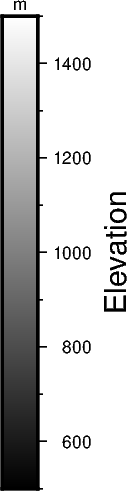

In [ ]:
fig = pygmt.Figure()
# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain",FORMAT_GEO_MAP="ddd.xx",FONT_ANNOT_PRIMARY="8p",FONT_ANNOT_SECONDARY="8p")
pygmt.makecpt(cmap="gray", series=[500, 1500])
fig.colorbar(region=[0,0.5,0,0.5],projection="M4c",position='jC+w4c/0.3c+v',frame=["x+lElevation", "y+lm"])
#fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/ColorbarDEM.pdf',dpi=300)
fig.show()


/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,
grdimage [WARNING]: Your CPT is categorical. Enabling -nn+a to avoid interpolation across categories.


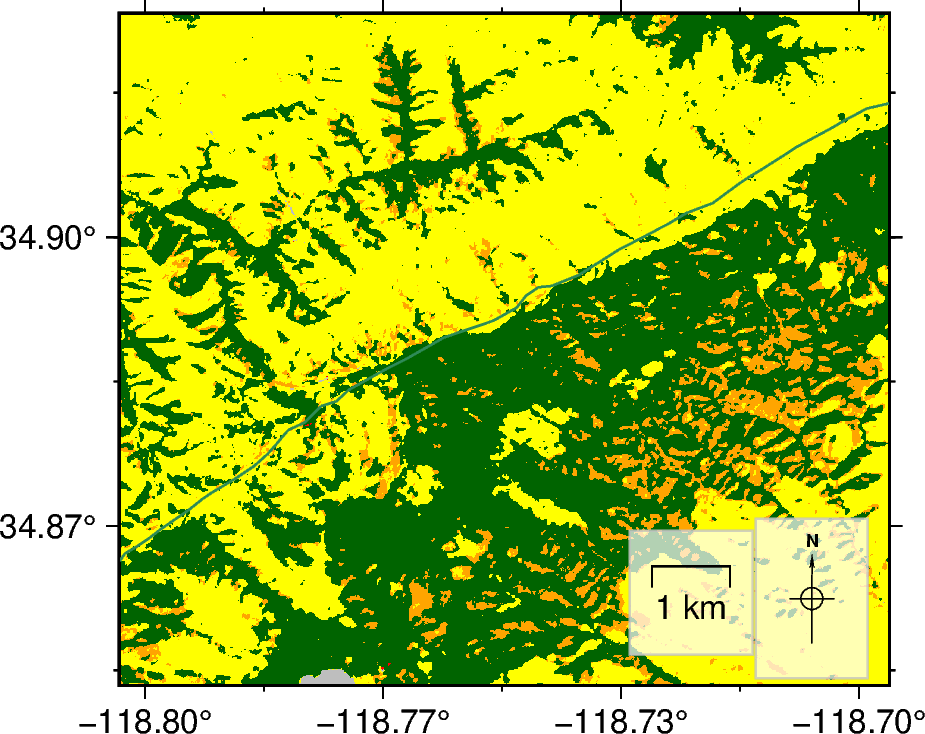

In [30]:
import pygmt
import pandas as pd

# Define the region and grid for each subplot
region = [w_inset_region,e_inset_region]  # Define your main region
images = [im3_lonlat,im4_lonlat]
name = ['W','E']

# Map of ESA WorldCover 2021 classes
landcover_names = {
    10: 'Trees',
    20: 'Shrubs',
    30: 'Grassland',
    40: 'None',
    50: 'Built-up',
    60: 'Barren', 
    70: 'None',
    80: 'Water'
}

# Define colors explicitly for each land cover category
landcover_colors = {
    10: 'darkgreen',      # Trees
    20: 'orange',     # Shrubs
    30: 'yellow',     # Grassland
    40: 'black',
    50: 'red',      # Built-up
    60: 'gray',       # Barren
    70: 'black',
    80: 'lightblue'   # Water
}

# Construct CPT labels
labels = str(list(landcover_names.values())).replace('\'','').replace('[','').replace(']','').replace(' ','')
colors = str(list(landcover_colors.values())).replace('\'','').replace('[','').replace(']','').replace(' ','')

for reg, im, name in zip(region[:-1],images[:-1],name[:-1]):
    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain",FORMAT_GEO_MAP="ddd.xx",
                 FONT_ANNOT_PRIMARY="8p",FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    fig.basemap(region=reg, projection="M6.5c", frame=["WSen", "af"])



    # Create categorical CPT
    pygmt.makecpt(series=[10,80,10],cmap=f'{colors}',color_model=f"+c{labels}", categorical=True)
    #pygmt.grd2cpt(im,series='10/90/10',cmap=f'{colors}',color_model=f"+c{labels}", categorical=True)
    im.data = im.data.astype(float) 
    fig.grdimage(grid=im,cmap=True)

    # Faults
    if name == 'W':
        pts = pd.read_csv('/Volumes/ProjectsGarlockCSAF/Garlock/GIS/WestPoints.csv')
        pts['id'] = pts.index
        # Project to UTM
        pts['x'], pts['y'] = pts.Lon, pts.Lat
        pts.dropna(inplace=True)
        pts['Lon'] = P(pts['x'],pts['y'],inverse=True)[0]
        pts['Lat'] = P(pts['x'],pts['y'],inverse=True)[1]
        pts.sort_values(by='Lon',ascending=True,inplace=True)
    else: 
        pts = pd.read_csv('/Volumes/ProjectsGarlockCSAF/Garlock/GIS/EastPoints.csv')
        pts.sort_values(by='Lon',ascending=True,inplace=True)
        
    fig.plot(x=pts.Lon,y=pts.Lat,pen="0.5p,seagreen")

    fig.basemap(map_scale='JBR+w1k+o-2c/-1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.46/0.35+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/Garlock{name}LandCover.pdf',dpi=300)

    fig.show()

In [22]:
# Map of ESA WorldCover 2021 classes
landcover_names = {
    10: 'Trees',
    20: 'Shrubs',
    30: 'Grassland',
    40: 'None',
    50: 'Built-up',
    60: 'Barren', 
    70: 'None',
    80: 'Water'
}

# Define colors explicitly for each land cover category
landcover_colors = {
    10: 'darkgreen',      # Trees
    20: 'orange',     # Shrubs
    30: 'yellow',     # Grassland
    40: 'black',
    50: 'red',      # Built-up
    60: 'gray',       # Barren
    70: 'black',
    80: 'lightblue'   # Water
}

# Construct CPT labels
labels = str(list(landcover_names.values())).replace('\'','').replace('[','').replace(']','').replace(' ','')
colors = str(list(landcover_colors.values())).replace('\'','').replace('[','').replace(']','').replace(' ','')


In [36]:
!gdalinfo /Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/defaultsMECdem/UDmicmacEPSG4326_bidenoise_filtered.tif

Driver: GTiff/GeoTIFF
Files: /Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/defaultsMECdem/UDmicmacEPSG4326_bidenoise_filtered.tif
Size is 25188, 16844
Coordinate System is:
GEOGCRS["WGS 84",
    ENSEMBLE["World Geodetic System 1984 ensemble",
        MEMBER["World Geodetic System 1984 (Transit)"],
        MEMBER["World Geodetic System 1984 (G730)"],
        MEMBER["World Geodetic System 1984 (G873)"],
        MEMBER["World Geodetic System 1984 (G1150)"],
        MEMBER["World Geodetic System 1984 (G1674)"],
        MEMBER["World Geodetic System 1984 (G1762)"],
        MEMBER["World Geodetic System 1984 (G2139)"],
        MEMBER["World Geodetic System 1984 (G2296)"],
        ELLIPSOID["WGS 84",6378137,298.257223563,
            LENGTHUNIT["metre",1]],
        ENSEMBLEACCURACY[2.0]],
    PRIMEM["Greenwich",0,
        ANGLEUNIT["degree",0.0174532925199433]],
    CS[ellipsoidal,2],
        AXIS["geodetic latitude (Lat)",north,
            ORDER[1],
            ANGLEUNIT["degree",0

In [ ]:
/Users/chanagan/Downloads/USGS_13_n36w118_20221019.tif 
/Users/chanagan/Downloads/USGS_13_n35w119_20240207.tif

In [39]:
!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.5599268 -116.8999914 35.6439349 -tr 0.000004987476809 -0.000004987418543 -r near -of GTiff -ot Float32 /Users/chanagan/Downloads/USGS_13_n36w118_20221019.tif /Users/chanagan/Downloads/USGS_13_n36w117_20221019.tif /Volumes/ProjectsGarlockCSAF/Garlock/USGS10mLidar/USGS_13_n36w118_117_20221019-cropped_upsampled.tif

Creating output file that is 25188P x 16844L.
Using internal nodata values (e.g. -999999) for image /Users/chanagan/Downloads/USGS_13_n36w118_20221019.tif.
Copying nodata values from source /Users/chanagan/Downloads/USGS_13_n36w118_20221019.tif to destination /Volumes/ProjectsGarlockCSAF/Garlock/USGS10mLidar/USGS_13_n36w118_117_20221019-cropped_upsampled.tif.
Processing /Users/chanagan/Downloads/USGS_13_n36w118_20221019.tif [1/2] : 0...10...20...30...40...50...60...70...80...90...100 - done.
Using internal nodata values (e.g. -999999) for image /Users/chanagan/Downloads/USGS_13_n36w117_20221019.tif.
Processing /Users/chanagan/Downloads/USGS_13_n36w117_20221019.tif [2/2] : 0...10...20...30...40...50...60...70...80...90...100 - done.


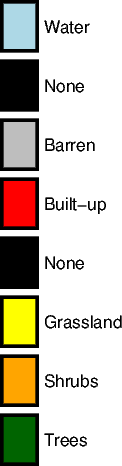

In [ ]:
fig = pygmt.Figure()
# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain",FORMAT_GEO_MAP="ddd.xx",FONT_ANNOT_PRIMARY="8p",FONT_ANNOT_SECONDARY="8p")
pygmt.makecpt(series=[10,80,10],cmap=f'{colors}',color_model=f"+c{labels}", categorical=True)
#pygmt.grd2cpt(im,series='10/90/10',cmap=f'{colors}',color_model=f"+c{labels}", categorical=True)

fig.colorbar(region=[0,0.5,0,0.5],projection="M4c",position='jC+w4c/0.3c+v',cmap=True)
#fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/ColorbarClassification.pdf',dpi=300)
fig.show()

# Deformation grids

In [ ]:
# Load deformation grids
im1_lonlat = rioxarray.open_rasterio('/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdX-rioEPSG4326.tif')
im2_lonlat = rioxarray.open_rasterio('/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdY-rioEPSG4326.tif')
im3_lonlat = rioxarray.open_rasterio('/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdZ-rio-x4EPSG4326.tif')

im4_lonlat = rioxarray.open_rasterio('/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdX-rioEPSG4326.tif')
im5_lonlat = rioxarray.open_rasterio('/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdY-rioEPSG4326.tif')
im6_lonlat = rioxarray.open_rasterio('/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdZ-rio-x4EPSG4326.tif')

RasterioIOError: /Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdX-rioEPSG4326.tif: No such file or directory

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


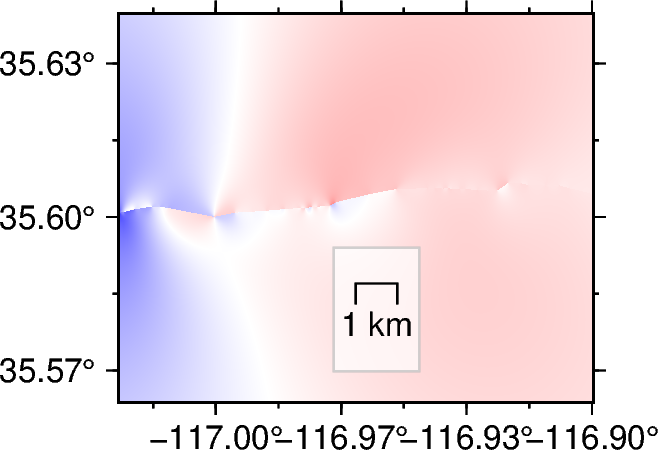

In [5]:
# Subfigures with the predeformed orthomosaics
# Introductory figure base
name = ['Edx','Edy','Edz','Wdx','Wdy','Wdz']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat,im5_lonlat,im6_lonlat]
for im,n in zip([imlist[1]],[name[1]]):
    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    if n.startswith('E'):
        fig.basemap(region=e_inset_region, projection="M4c", frame=["WSen", "af"])
    else:
        fig.basemap(region=w_inset_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-1,1],background='o',reverse=True)
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-2c/-1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

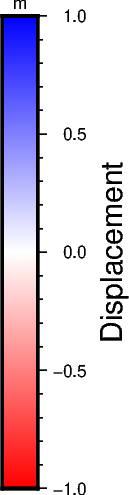

In [36]:
fig = pygmt.Figure()
# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="8p")
pygmt.makecpt(cmap='polar',series=[-1,1],background='o',reverse=True)
fig.colorbar(region=[0,0.5,0,0.5],projection="M4c",position='jC+w4c/0.3c+v',frame=["x+lDisplacement", "y+lm"])
fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/Colorbar0.5.pdf',dpi=300)
fig.show()

## Filtered result maps and residual maps

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


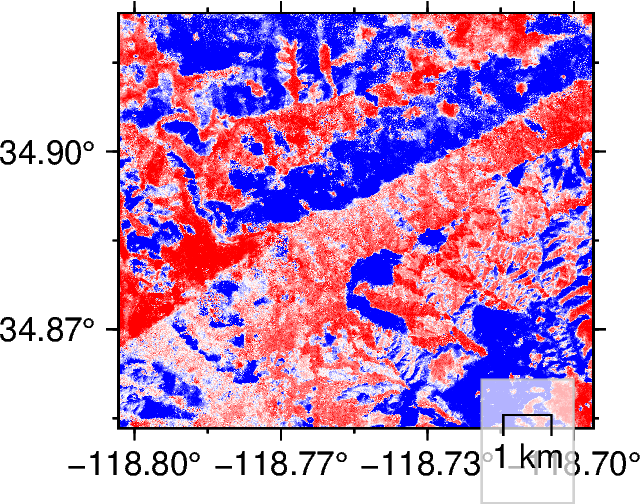

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


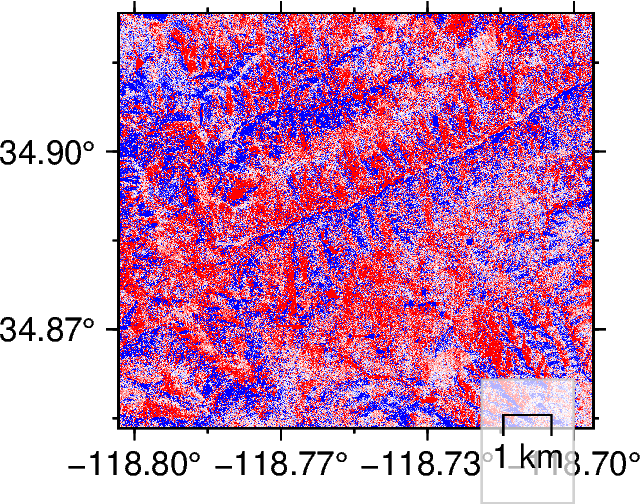

In [3]:
# Load deformation grids
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/EWDispStackedEPSG4326.tif'
im2_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/NSDispStackedEPSG4326.tif'
im3_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/UDDispStackedEPSG4326.tif'

im4_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/EWDispStackedEPSG4326.tif'
im5_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/NSDispStackedEPSG4326.tif'
im6_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/UDDispStackedEPSG4326.tif'
# Subfigures with the predeformed orthomosaics
# Introductory figure base
name = ['ExNoFilt','EyNoFilt','EzNoFilt','WxNoFilt','WyNoFilt','WzNoFilt']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat,im5_lonlat,im6_lonlat]
for iml,n in zip(imlist[4:],name[4:]):
    im = rioxarray.open_rasterio(iml)
    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    if n.startswith('E'):
        fig.basemap(region=e_inset_region, projection="M4c", frame=["WSen", "af"])
    else:
        fig.basemap(region=w_inset_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-1,1],background='o',reverse=True)
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/-0.1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


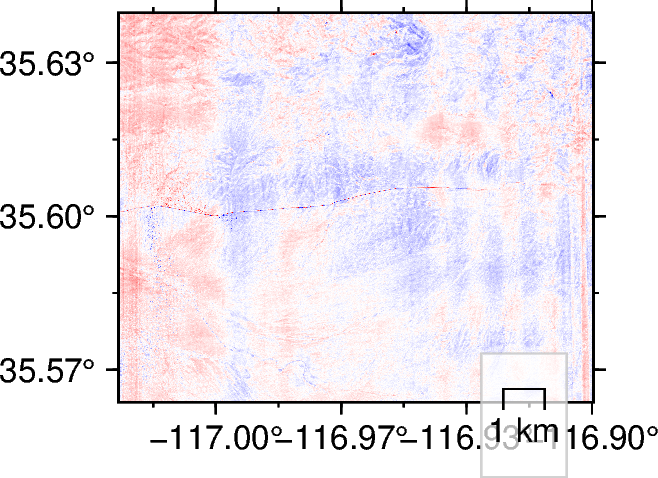

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


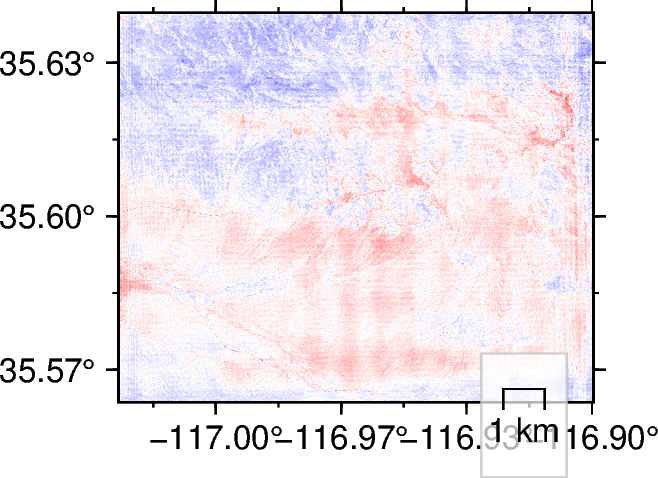

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


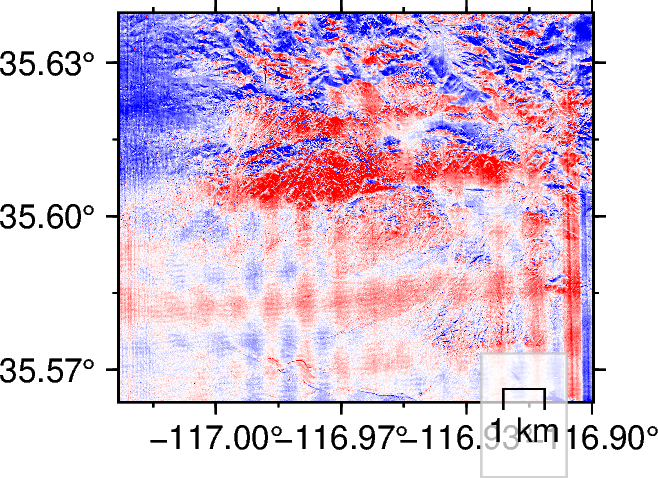

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


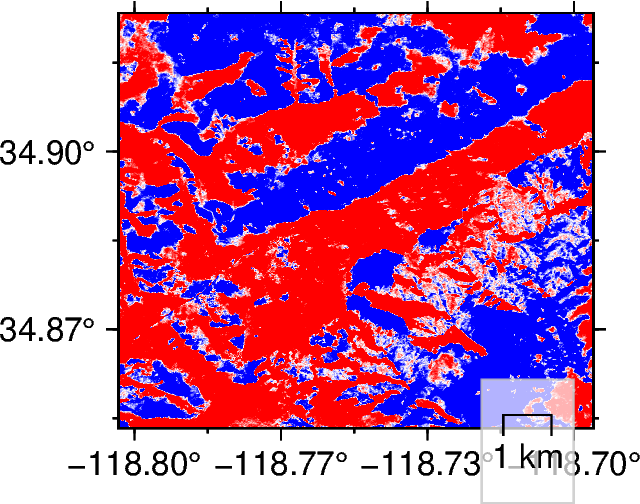

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


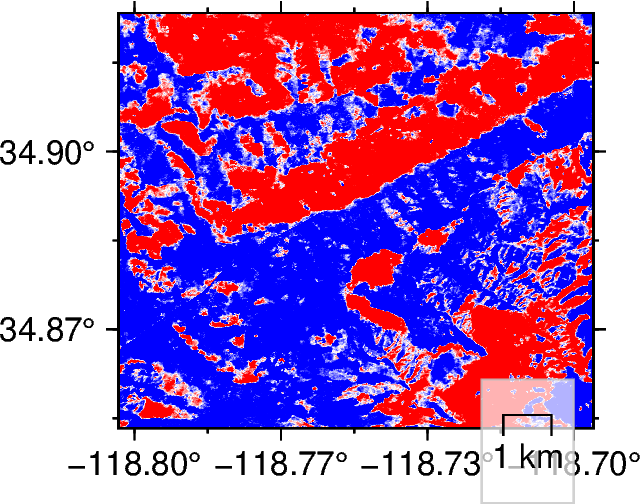

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


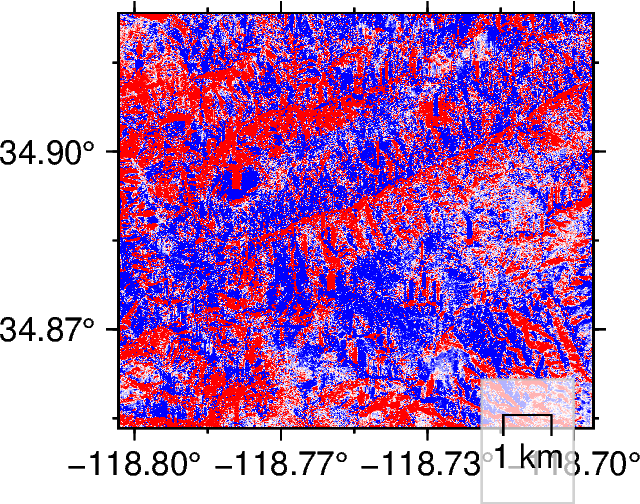

In [ ]:
# Load deformation grids
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/EWDispStackedEPSG4326_bidenoise_filtered.tif'
im2_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/NSDispStackedEPSG4326_bidenoise_filtered.tif'
im3_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/UDDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'

im4_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/EWDispStackedEPSG4326_bidenoise_filtered.tif'
im5_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/NSDispStackedEPSG4326_bidenoise_filtered.tif'
im6_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/UDDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'

im1m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdX-rioEPSG4326.tif'
im2m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdY-rioEPSG4326.tif'
im3m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdZ-rio-x4EPSG4326.tif'

im4m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdX-rioEPSG4326.tif'
im5m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdY-rioEPSG4326.tif'
im6m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdZ-rio-x4EPSG4326.tif'

# Introductory figure base
name = ['ExDenoiseFiltRes','EyDenoiseFiltRes','EzDenoiseFiltRes','WxDenoiseFiltRes','WyDenoiseFiltRes','WzDenoiseFiltRes']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat,im5_lonlat,im6_lonlat]
immlist = [im1m_lonlat,im2m_lonlat,im3m_lonlat,im4m_lonlat,im5m_lonlat,im6m_lonlat]
for iml,imm,n in zip(imlist,immlist,name):
    immo = rioxarray.open_rasterio(imm)
    imob = rioxarray.open_rasterio(iml)
    im = immo - imob # model minus observed
    im -= im.mean()

    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    if n.startswith('E'):
        fig.basemap(region=e_inset_region, projection="M4c", frame=["WSen", "af"])
    else:
        fig.basemap(region=w_inset_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-0.5,0.5],background='o',reverse=True)
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/-0.1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


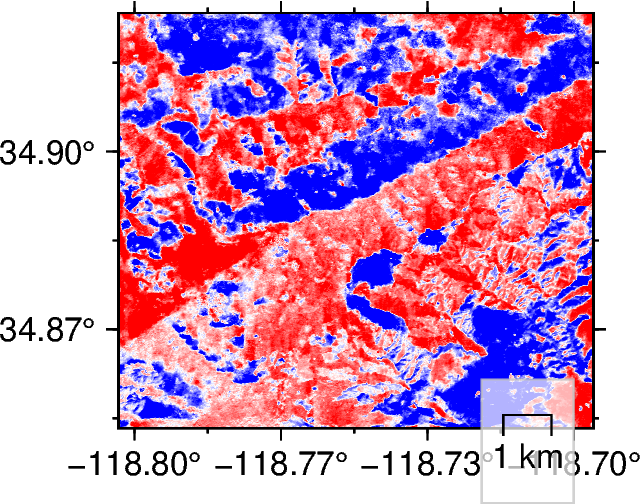

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


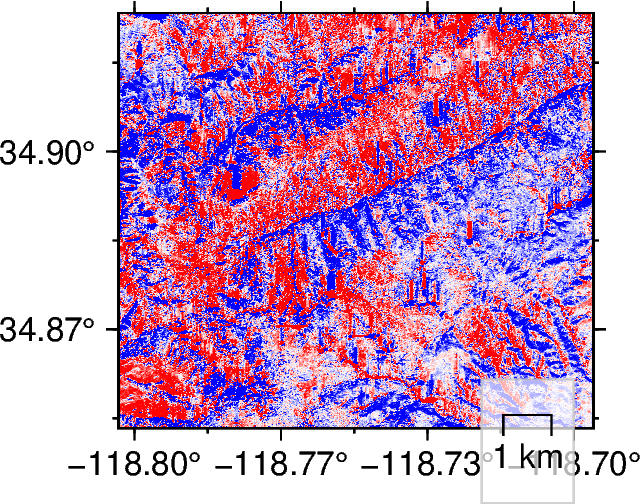

In [5]:
# Load deformation grids
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/EWDispStackedEPSG4326_bidenoise_filtered.tif'
im2_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/NSDispStackedEPSG4326_bidenoise_filtered.tif'
im3_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'

im4_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/EWDispStackedEPSG4326_bidenoise_filtered.tif'
im5_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/NSDispStackedEPSG4326_bidenoise_filtered.tif'
im6_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'

# Introductory figure base
name = ['ExDenoiseFiltOrthoStacked','EyDenoiseFiltOrthoStacked','EzDenoiseFiltOrthoStacked','WxDenoiseFiltOrthoStacked','WyDenoiseFiltOrthoStacked','WzDenoiseFiltOrthoStacked']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat,im5_lonlat,im6_lonlat]
for iml,n in zip(imlist[4:],name[4:]):
    im = rioxarray.open_rasterio(iml)
    im -= im.mean()

    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain",FORMAT_GEO_MAP="ddd.xx",FONT_ANNOT_PRIMARY="8p",FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    if n.startswith('E'):
        fig.basemap(region=e_inset_region, projection="M4c", frame=["WSen", "af"])
    else:
        fig.basemap(region=w_inset_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-1,1],background='o',reverse=True)
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/-0.1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

# DEMs

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


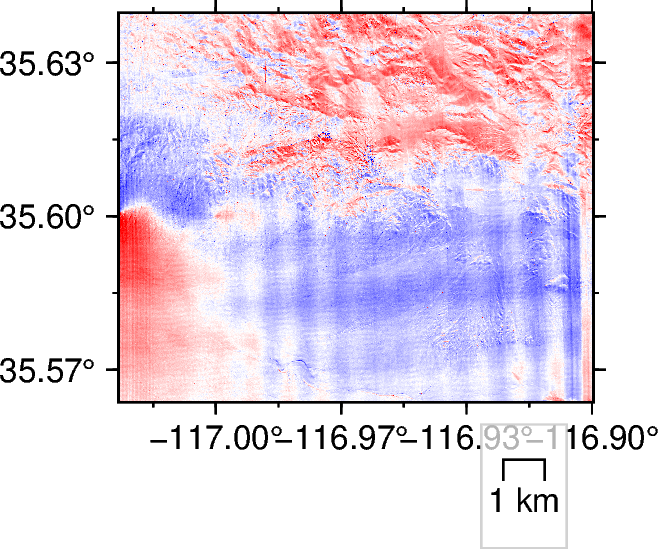

In [5]:
# Load deformation grids
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/EWmicmacEPSG4326_bidenoise_filtered.tif'
im2_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/NSmicmacEPSG4326_bidenoise_filtered.tif'
im3_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'

im4_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/EWmicmacEPSG4326_bidenoise_filtered.tif'
im5_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/NSmicmacEPSG4326_bidenoise_filtered.tif'
im6_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'
# Subfigures with the predeformed orthomosaics
# Introductory figure base
name = ['ExDEMDenoiseFilt','EyDEMDenoiseFilt','EzDEMDenoiseFilt','WxDEMDenoiseFilt','WyDEMDenoiseFilt','WzDEMDenoiseFilt']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat,im5_lonlat,im6_lonlat]
for iml,n in zip(imlist[2:3],name[2:3]):
    im = rioxarray.open_rasterio(iml)
    #im -= im.mean()
    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    if n.startswith('E'):
        fig.basemap(region=e_inset_region, projection="M4c", frame=["WSen", "af"])
    else:
        fig.basemap(region=w_inset_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-1,1],background='o',reverse=True)
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/0.5c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


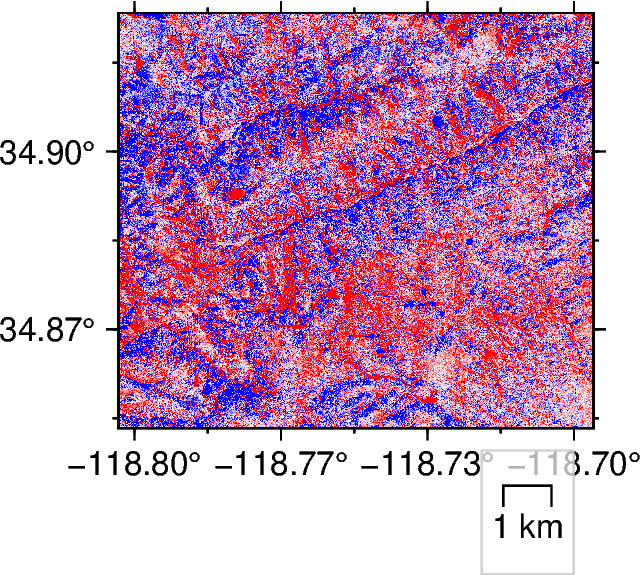

In [4]:
# Load deformation grids
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/EWmicmacEPSG4326.tif'
im2_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/NSmicmacEPSG4326.tif'
im3_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/UDmicmacEPSG4326.tif'

im4_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/EWmicmacEPSG4326.tif'
im5_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/NSmicmacEPSG4326.tif'
im6_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/UDmicmacEPSG4326.tif'
# Subfigures with the predeformed orthomosaics
# Introductory figure base
name = ['ExDEMNoFilt','EyNoDEMFilt','EzNoDEMFilt','WxNoDEMFilt','WyNoDEMFilt','WzNoDEMFilt']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat,im5_lonlat,im6_lonlat]
for iml,n in zip(imlist[-1:],name[-1:]):
    im = rioxarray.open_rasterio(iml)
    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    if n.startswith('E'):
        fig.basemap(region=e_inset_region, projection="M4c", frame=["WSen", "af"])
    else:
        fig.basemap(region=w_inset_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-1,1],background='o',reverse=True)
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/0.5c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


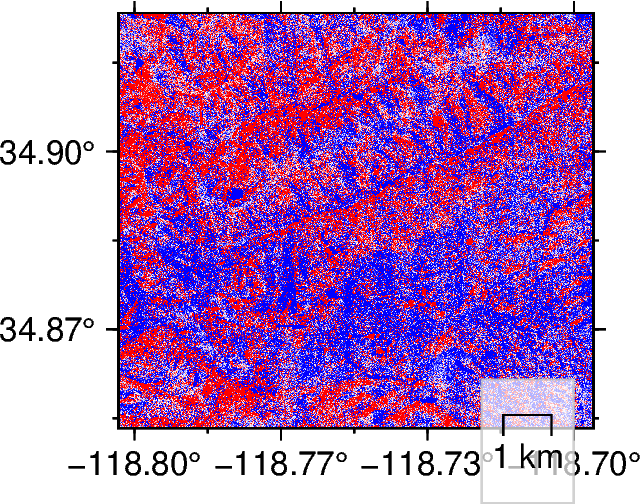

In [ ]:
# DEMs residuals
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/EWmicmacEPSG4326.tif'
im2_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/NSmicmacEPSG4326.tif'
im3_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/UDmicmacEPSG4326.tif'

im4_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/EWmicmacEPSG4326.tif'
im5_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/NSmicmacEPSG4326.tif'
im6_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/UDmicmacEPSG4326.tif'

im1m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdX-rioEPSG4326.tif'
im2m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdY-rioEPSG4326.tif'
im3m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdZ-rio-x4EPSG4326.tif'

im4m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdX-rioEPSG4326.tif'
im5m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdY-rioEPSG4326.tif'
im6m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdZ-rio-x4EPSG4326.tif'

# Introductory figure base
name = ['ExDEMnoFiltRes','EyDEMnoFiltRes','EzDEMnoFiltRes','WxDEMnoFiltRes','WyDEMnoFiltRes','WzDEMnoFiltRes']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat,im5_lonlat,im6_lonlat]
immlist = [im1m_lonlat,im2m_lonlat,im3m_lonlat,im4m_lonlat,im5m_lonlat,im6m_lonlat]
for iml,imm,n in zip(imlist[5:],immlist[5:],name[5:]):
    immo = rioxarray.open_rasterio(imm)
    imob = rioxarray.open_rasterio(iml)
    im = immo - imob # model minus observed
    im -= im.mean()

    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    if n.startswith('E'):
        fig.basemap(region=e_inset_region, projection="M4c", frame=["WSen", "af"])
    else:
        fig.basemap(region=w_inset_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-0.5,0.5],background='o',reverse=True)
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/-0.1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    #fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

## Garlock West Clipped Region

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float32 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


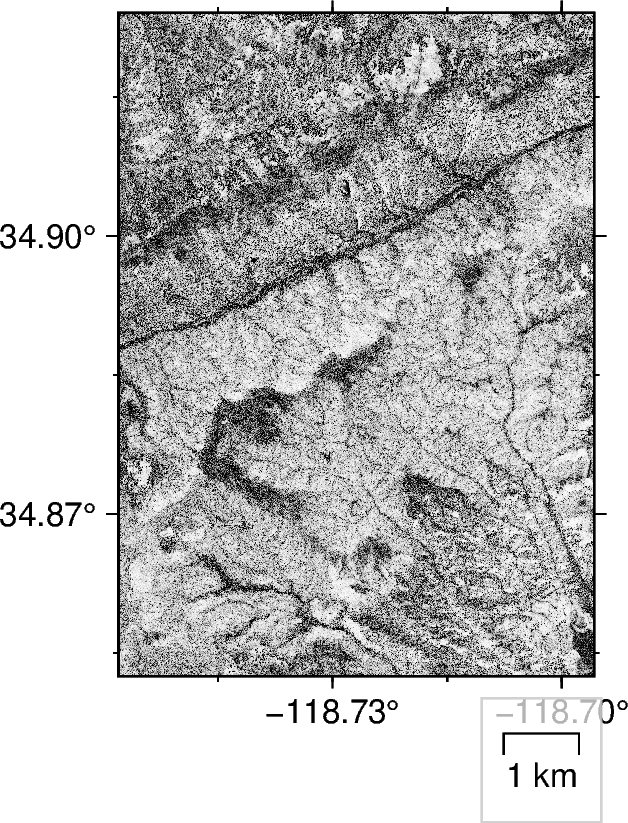

In [4]:
# Maps of clip region - Correl files from dem

# Load deformation grids
im1_lonlat = '/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/JanFebDemFiltered/CorrelmicmacEPSG4326.tif'
# Subfigures with the predeformed orthomosaics
# Introductory figure base
name = ['WcorrelDEMJanFeb']
imlist = [im1_lonlat]
for iml,n in zip(imlist,name):
    im = rioxarray.open_rasterio(iml)
    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    fig.basemap(region=small_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='gray',series=[0.1,1],background='o')
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/0.5c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float32 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


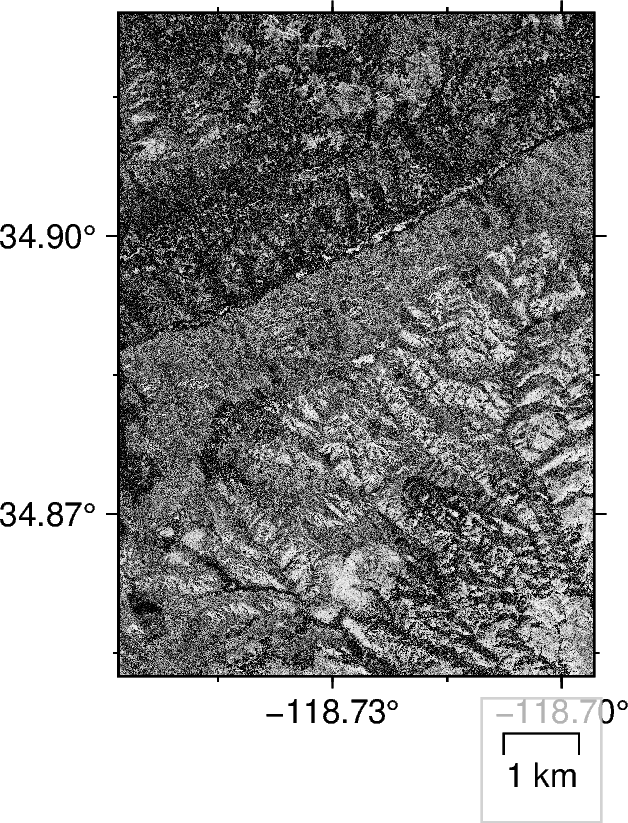

In [3]:
# Maps of clip region - Correl files from dem

# Load deformation grids
im1_lonlat = '/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/JanFebOrthoFiltered/CorrelmicmacEPSG4326.tif'
# Subfigures with the predeformed orthomosaics
# Introductory figure base
name = ['WcorrelOrthoJanFeb']
imlist = [im1_lonlat]
for iml,n in zip(imlist,name):
    im = rioxarray.open_rasterio(iml)
    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    fig.basemap(region=small_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='gray',series=[0.1,1],background='o')
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/0.5c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float32 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


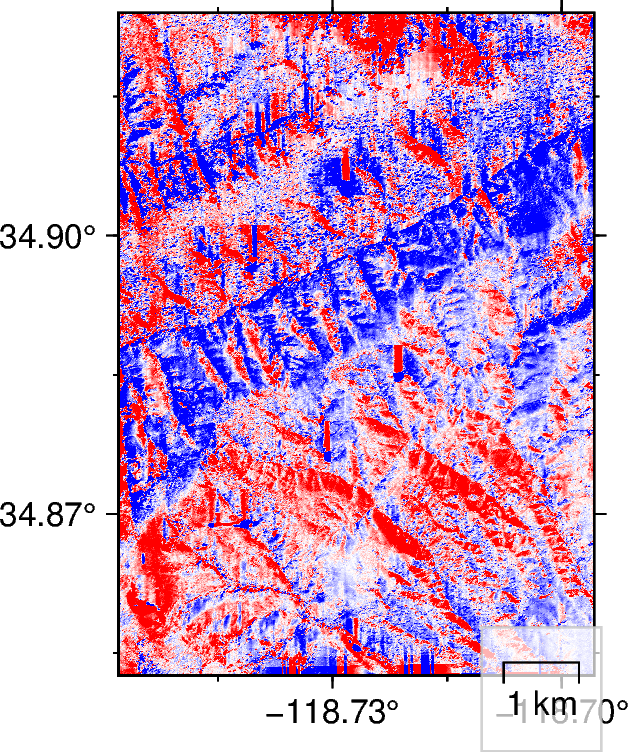

In [4]:
# Orthos residuals
im1_lonlat = '/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/JanFebOrthoFiltered/EWmicmac_bidenoise_filteredEPSG4326.tif'
im2_lonlat = '/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/JanFebOrthoFiltered/NSmicmac_bidenoise_filteredEPSG4326.tif'
im3_lonlat = '/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/JanFebOrthoFiltered/UDfromHDispEPSG4326_bidenoise_filtered_refiltered.tif'

# Introductory figure base
name = ['WxOrthoJanFebFilt','WyOrthoJanFebFilt','WzOrthoJanFebFilt']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat]
for iml,n in zip(imlist[-1:],name[-1:]):
    imob = rioxarray.open_rasterio(iml)
    imob.data = imob.data - np.mean(imob.data) # model minus observed

    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    fig.basemap(region=small_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-1,1],background='o',reverse=True)
    fig.grdimage(grid=imob,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/-0.1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float32 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


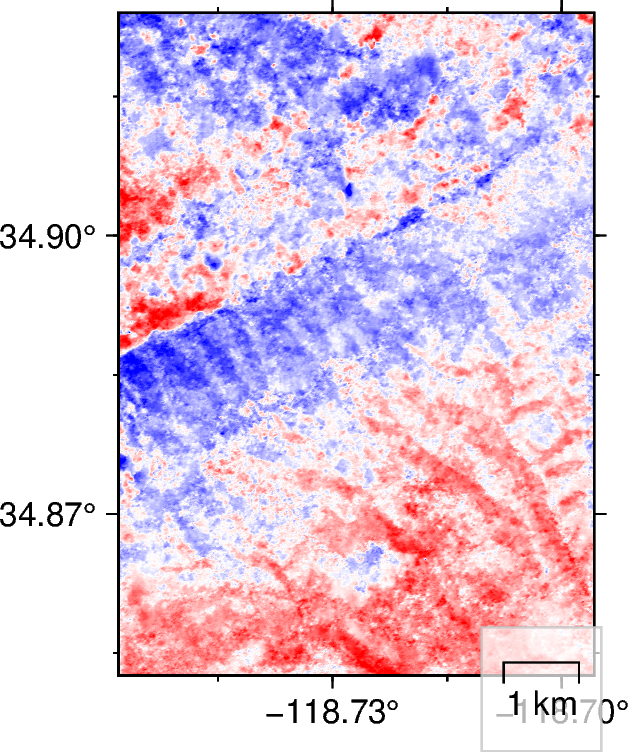

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float32 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


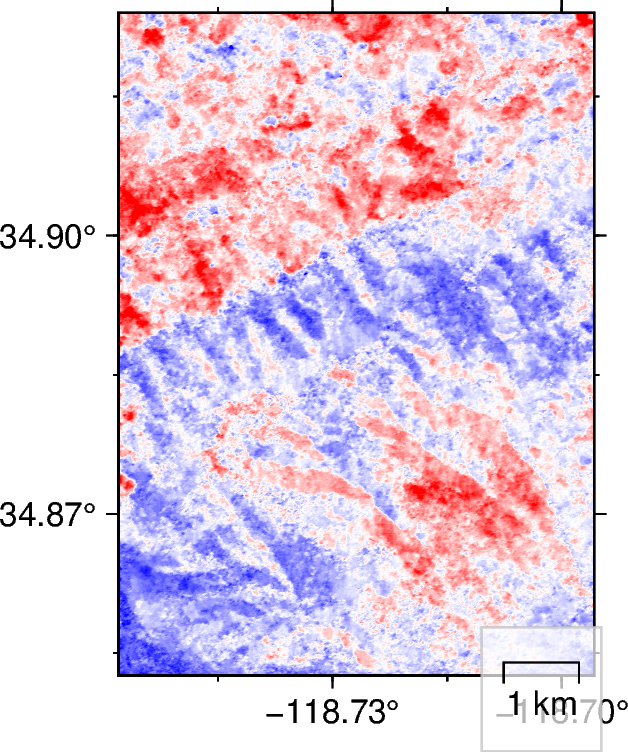

In [16]:
# DEMs residuals
im1_lonlat = '/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/JanFebDemFiltered/EWmicmac_bidenoise_filteredEPSG4326.tif'
im2_lonlat = '/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/JanFebDemFiltered/NSmicmac_bidenoise_filteredEPSG4326.tif'
im3_lonlat = '/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/JanFebDemFiltered/UDfromHDispEPSG4326_bidenoise_filtered_refiltered.tif'

# Introductory figure base
name = ['WxDEMJanFebFilt','WyDEMJanFebFilt','WzDEMJanFebFilt']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat]
for iml,n in zip(imlist[:-1],name[:-1]):
    imob = rioxarray.open_rasterio(iml)
    imob.data = imob.data - np.mean(imob.data) # model minus observed

    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    fig.basemap(region=small_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-1,1],background='o',reverse=True)
    fig.grdimage(grid=imob,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/-0.1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


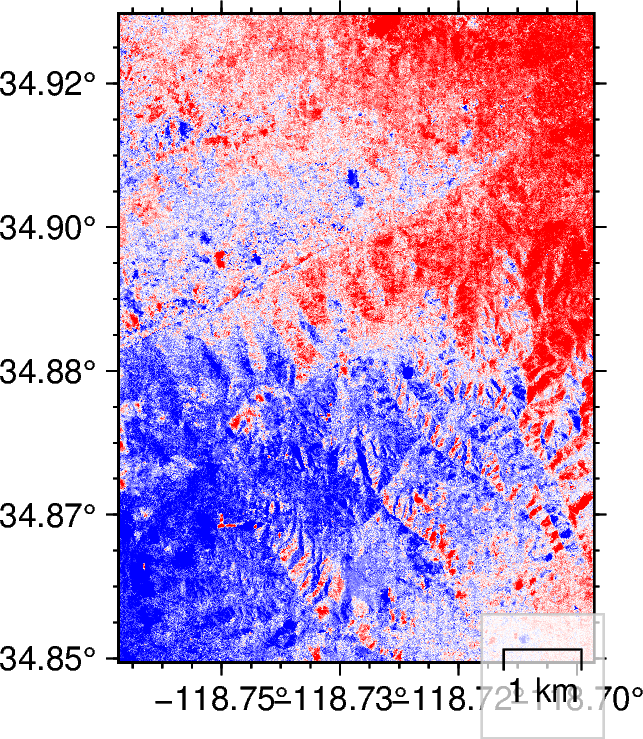

In [ ]:
# DEMs residuals
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFebInc8/EW-clipped-EPSG4326_bidenoise_filtered.tif'
im2_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFebInc8/NS-clipped-EPSG4326_bidenoise_filtered.tif'

im1m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdX-rioEPSG4326-clipped.tif'
im2m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdY-rioEPSG4326-clipped.tif'

# Introductory figure base
name = ['WxDEMJanFebnoFiltRes','WyDEMJanFebnoFiltRes','WxOrthoJanFebnoFiltRes','WyOrthoJanFebnoFiltRes']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat]
immlist = [im1m_lonlat,im2m_lonlat,im1m_lonlat,im2m_lonlat]
for iml,imm,n in zip(imlist[3:],immlist[3:],name[3:]):
    immo = rioxarray.open_rasterio(imm)
    imob = rioxarray.open_rasterio(iml)
    imob.data = (immo.data - imob.data) - np.mean(immo.data - imob.data) # model minus observed

    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    fig.basemap(region=small_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-0.5,0.5],background='o',reverse=True)
    fig.grdimage(grid=imob,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/-0.1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


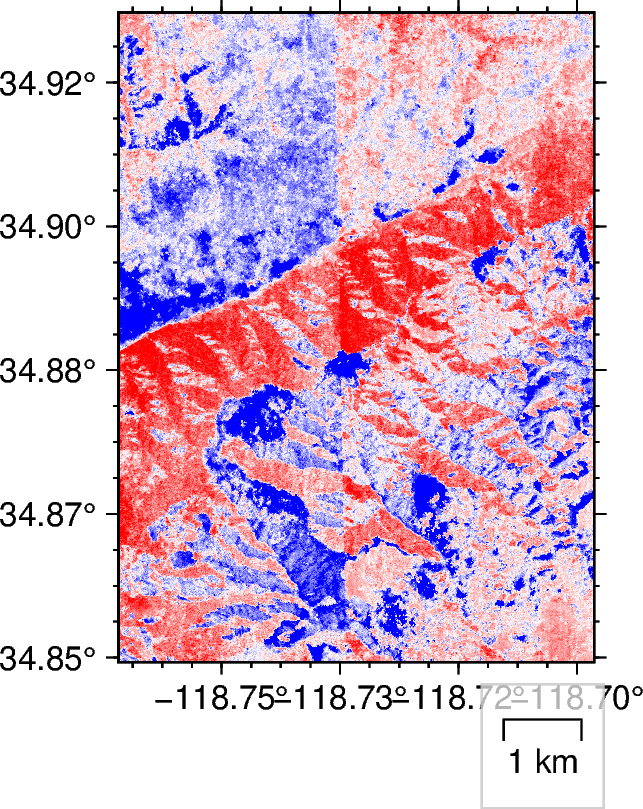

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


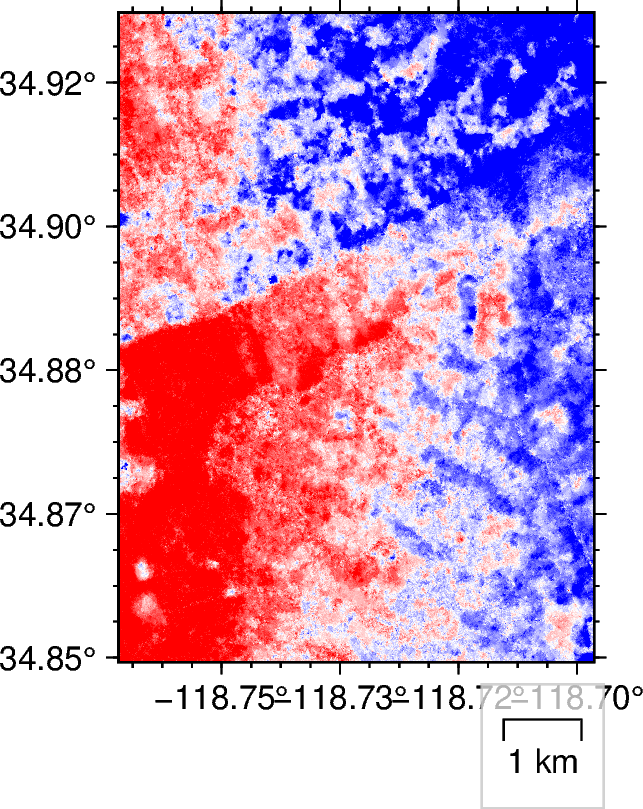

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


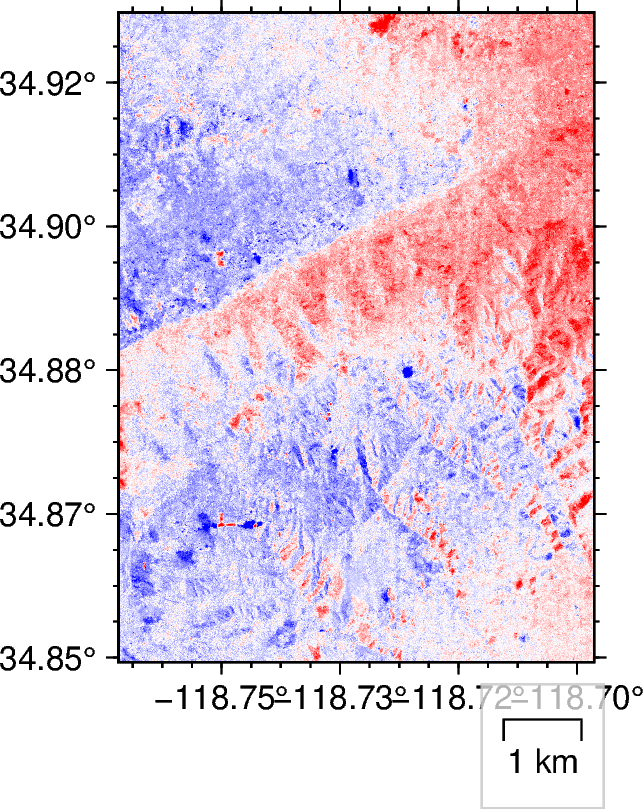

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


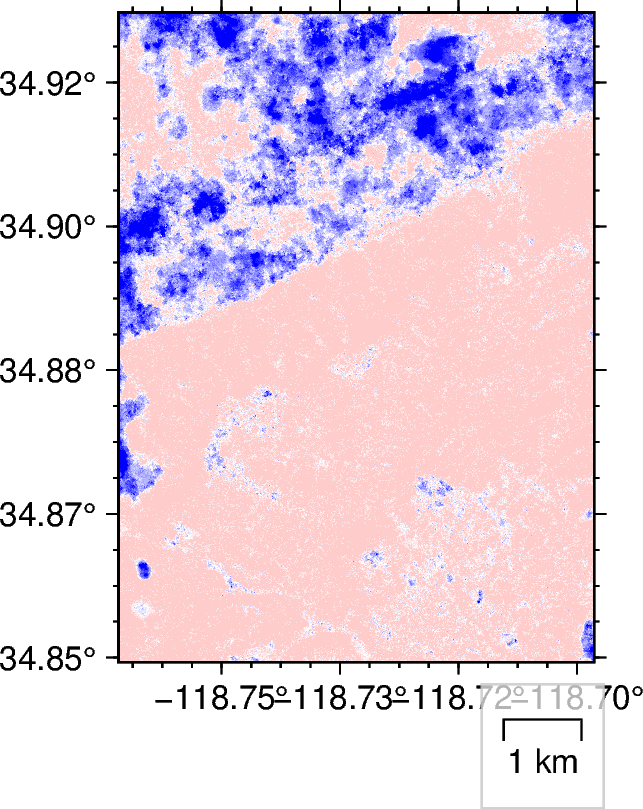

In [3]:
# Load deformation grids
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2022JanFeb/EW-clipped-EPSG4326.tif'
im2_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFeb/EW-clipped-EPSG4326.tif'
im3_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2022JanFeb/NS-clipped-EPSG4326.tif'
im4_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFeb/NS-clipped-EPSG4326.tif'
# Subfigures with the predeformed orthomosaics
# Introductory figure base
name = ['WdXOrthoJanFeb','WdXDEMJanFeb','WdYOrthoJanFeb','WdYDEMJanFeb']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat]
for iml,n in zip(imlist,name):
    im = rioxarray.open_rasterio(iml)
    im -= im.mean()
    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    fig.basemap(region=small_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-1,1],background='o',reverse=True)
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/0.5c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

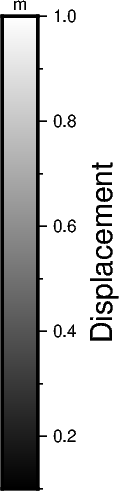

In [12]:
fig = pygmt.Figure()
# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="8p")
pygmt.makecpt(cmap='gray',series=[0.1,1.0],background='o')
fig.colorbar(region=[0,0.5,0,0.5],projection="M4c",position='jC+w4c/0.3c+v',frame=["x+lCorrelation", "y+lm"])
#fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/ColorbarGray.pdf',dpi=300)
fig.show()

## Residuals and standard deviations

In [20]:
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/EWmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/NSmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/UDmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/CorrelmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/EWmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/NSmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/UDmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/CorrelmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC3/EWmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC3/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC3/NSmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC3/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC3/UDmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC3/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC3/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC3/CorrelmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC4/EWmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC4/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC4/NSmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC4/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC4/UDmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC4/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC4/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC4/CorrelmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/EWmicmac.tif   /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/NSmicmac.tif   /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/UDmicmac.tif   /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/CorrelmicmacEPSG4326.tif

Creating output file that is 21560P x 15499L.
Using internal nodata values (e.g. 0) for image /Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/EWmicmac.tif.
Copying nodata values from source /Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/EWmicmac.tif to destination /Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/EWmicmacEPSG4326.tif.
Processing /Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/EWmicmac.tif [1/1] : 0...10...20...30...40...50...60...70...80...90...100 - done.
Creating output file that is 21560P x 15499L.
Using internal nodata values (e.g. 0) for image /Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/NSmicmac.tif.
Copying nodata values from source /Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/NSmicmac.tif to destination /Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/NSmicmacEPSG4326.tif

In [5]:
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/EWmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/NSmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/UDmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/CorrelmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC2/EWmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC2/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC2/NSmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC2/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC2/UDmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC2/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC2/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC2/CorrelmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/EWmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/NSmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/UDmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/CorrelmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC4/EWmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC4/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC4/NSmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC4/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC4/UDmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC4/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC4/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC4/CorrelmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/EWmicmac.tif   /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/NSmicmac.tif   /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/UDmicmac.tif   /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/CorrelmicmacEPSG4326.tif

Creating output file that is 25061P x 16759L.
Using internal nodata values (e.g. 0) for image /Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/EWmicmac.tif.
Copying nodata values from source /Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/EWmicmac.tif to destination /Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/EWmicmacEPSG4326.tif.
Processing /Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/EWmicmac.tif [1/1] : 0...10...20...30...40...50...60...70...80...90...100 - done.
Creating output file that is 25061P x 16759L.
Using internal nodata values (e.g. 0) for image /Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/NSmicmac.tif.
Copying nodata values from source /Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/NSmicmac.tif to destination /Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/NSmicmacEPSG4326.tif

In [61]:
# Stacked v unstacked
foldlist = ['defaultsMEC1','defaultsMEC2','defaultsMEC3','defaultsMEC4','defaultsMECdem']
Region = 'West'
for fold in foldlist:
    for direction, cart in zip(['EW','NS','UD'],['X','Y','Z']):
        imun = rioxarray.open_rasterio(f'/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/{Region}/{fold}/{direction}micmacEPSG4326.tif')
        imst = rioxarray.open_rasterio(f'/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/{Region}/Stacked/{direction}DispStackedEPSG4326.tif')

        immo = rioxarray.open_rasterio(f'/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/{Region}/Modeled/{Region}d{cart}-rioEPSG4326.tif')

        # Residual maps of model vs unstacked and stacked results
        im1 = np.sqrt((immo - imun)**2)
        im1 -= im1.mean()
        im2 = np.sqrt((immo - imst)**2)
        im2 -= im2.mean()

        print('Mean rmse, unstacked vs stacked',fold, direction)
        print(np.round(np.mean(np.abs(im1)).values*100,1),'(',np.round(np.std(np.abs(im1)).values*100,1),')',
              np.round(np.mean(np.abs(im2)).values*100,1),'(',np.round(np.std(np.abs(im2)).values*100,1),')')

Mean rmse, unstacked vs stacked defaultsMEC1 EW
69.4 ( 40.7 ) 60.0 ( 40.4 )
Mean rmse, unstacked vs stacked defaultsMEC1 NS
59.6 ( 38.6 ) 43.9 ( 33.6 )
Mean rmse, unstacked vs stacked defaultsMEC1 UD
144.3 ( 206.9 ) 140.9 ( 204.6 )
Mean rmse, unstacked vs stacked defaultsMEC2 EW
51.9 ( 41.2 ) 60.0 ( 40.4 )
Mean rmse, unstacked vs stacked defaultsMEC2 NS
36.0 ( 30.1 ) 43.9 ( 33.6 )
Mean rmse, unstacked vs stacked defaultsMEC2 UD
143.2 ( 207.0 ) 140.9 ( 204.6 )
Mean rmse, unstacked vs stacked defaultsMEC3 EW
68.0 ( 40.1 ) 60.0 ( 40.4 )
Mean rmse, unstacked vs stacked defaultsMEC3 NS
54.0 ( 38.6 ) 43.9 ( 33.6 )
Mean rmse, unstacked vs stacked defaultsMEC3 UD
141.4 ( 204.9 ) 140.9 ( 204.6 )
Mean rmse, unstacked vs stacked defaultsMEC4 EW
62.6 ( 39.9 ) 60.0 ( 40.4 )
Mean rmse, unstacked vs stacked defaultsMEC4 NS
47.9 ( 33.0 ) 43.9 ( 33.6 )
Mean rmse, unstacked vs stacked defaultsMEC4 UD
140.9 ( 204.6 ) 140.9 ( 204.6 )
Mean rmse, unstacked vs stacked defaultsMECdem EW
35.7 ( 24.7 ) 60.0 ( 4

In [72]:
# Filtered v unfiltered
foldlist = ['Stacked','defaultsMECdem']
Region = 'West'
for fold in foldlist:
    for direction, cart in zip(['EW','NS','UD'],['X','Y','Z']):
        if direction.startswith('E') or direction.startswith('N'):
            if fold.endswith('dem'):
                imun = rioxarray.open_rasterio(f'/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/{Region}/{fold}Filtered/{direction}micmacEPSG4326_bidenoise_filtered.tif')
                imst = rioxarray.open_rasterio(f'/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/{Region}/{fold}/{direction}micmacEPSG4326.tif')
            else:
                imun = rioxarray.open_rasterio(f'/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/{Region}/{fold}Filtered/{direction}DispStackedEPSG4326_bidenoise_filtered.tif')
                imst = rioxarray.open_rasterio(f'/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/{Region}/{fold}/{direction}DispStackedEPSG4326.tif')

        else:
            imun = rioxarray.open_rasterio(f'/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/{Region}/{fold}Filtered/{direction}fromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif')
            if fold.endswith('dem'):
                imst = rioxarray.open_rasterio(f'/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/{Region}/{fold}/{direction}micmacEPSG4326.tif')
            else:
                imst = rioxarray.open_rasterio(f'/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/{Region}/{fold}/{direction}DispStackedEPSG4326.tif')

        immo = rioxarray.open_rasterio(f'/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/{Region}/Modeled/{Region}d{cart}-rioEPSG4326.tif')

        # Residual maps of model vs unstacked and stacked results
        im1 = np.sqrt((immo - imun)**2)
        im1 -= im1.mean()
        im2 = np.sqrt((immo - imst)**2)
        im2 -= im2.mean()

        print('Mean rmse, unfiltered vs filtered',fold, direction)
        print(np.round(np.mean(np.abs(im2)).values*100,1),'(',np.round(np.std(np.abs(im2)).values*100,1),')',
              np.round(np.mean(np.abs(im1)).values*100,1),'(',np.round(np.std(np.abs(im1)).values*100,1),')')

Mean rmse, unfiltered vs filtered Stacked EW
60.0 ( 40.4 ) 58.4 ( 40.1 )
Mean rmse, unfiltered vs filtered Stacked NS
43.9 ( 33.6 ) 42.0 ( 32.4 )
Mean rmse, unfiltered vs filtered Stacked UD
140.9 ( 204.6 ) 99.9 ( 148.5 )
Mean rmse, unfiltered vs filtered defaultsMECdem EW
35.7 ( 24.7 ) 34.6 ( 23.9 )
Mean rmse, unfiltered vs filtered defaultsMECdem NS
27.1 ( 20.3 ) 25.4 ( 19.1 )
Mean rmse, unfiltered vs filtered defaultsMECdem UD
140.2 ( 206.1 ) 98.5 ( 148.2 )


Creating output file that is 13775P x 15863L.
Processing /Volumes/ProjectsGarlockCSAF/Garlock/Deformation/West/WestdZ-rio.tif [1/1] : 0...10...20...30...40...50...60...70...80...90...100 - done.


In [3]:
# Small region
foldlist = ['JanFebOrthoFiltered','JanFebDemFiltered']
Region = 'West'
for fold in foldlist:
    for direction, cart in zip(['EW','NS','UD'],['X','Y','Z']):
        if cart == 'Z':
            imun = rioxarray.open_rasterio(f'/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/{Region}/{fold}/{direction}fromHDispEPSG4326_bidenoise_filtered_refiltered.tif')
        else:
            imun = rioxarray.open_rasterio(f'/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/{Region}/{fold}/{direction}micmac_bidenoise_filteredEPSG4326.tif')
        
        immo = rioxarray.open_rasterio(f'/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/{Region}/JanFebModeledClipped/{Region}d{cart}-rioEPSG4326.tif')

        # Residual maps of model vs unstacked and stacked results
        im1 = np.sqrt((immo - imun)**2)
        im1 -= im1.mean()

        print('Mean rmse, clipped region',fold, direction)
        print(np.round(np.mean(np.abs(im1)).values*100,1),'(',np.round(np.std(np.abs(im1)).values*100,1),')')

Mean rmse, clipped region JanFebOrthoFiltered EW
29.4 ( 25.8 )
Mean rmse, clipped region JanFebOrthoFiltered NS
11.4 ( 9.7 )
Mean rmse, clipped region JanFebOrthoFiltered UD
80.3 ( 117.0 )
Mean rmse, clipped region JanFebDemFiltered EW
33.3 ( 21.5 )
Mean rmse, clipped region JanFebDemFiltered NS
17.2 ( 13.9 )
Mean rmse, clipped region JanFebDemFiltered UD
71.5 ( 105.1 )


# Boxplot of residuals 

In [1]:
import rioxarray
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# Boxplot with residuals horizontals, stacked, dem, stacked, filtered

# horizontals, both regions, stacked
modWew = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/Modeled/WestdX-rioEPSG4326.tif')
modWns = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/Modeled/WestdY-rioEPSG4326.tif')
modEew = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/Modeled/EastdX-rioEPSG4326.tif')
modEns = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/Modeled/EastdY-rioEPSG4326.tif')

stackedEew = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/Stacked/EWDispStackedEPSG4326.tif') 
stackedEew = np.sqrt((modEew -stackedEew)**2) - np.mean(np.sqrt((modEew -stackedEew)**2))
stackedEns = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/Stacked/NSDispStackedEPSG4326.tif')
stackedEns = np.sqrt((modEns -stackedEns)**2) - np.mean(np.sqrt((modEns -stackedEns)**2))
stackedWew = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/Stacked/EWDispStackedEPSG4326.tif') 
stackedWew = np.sqrt((modWew -stackedWew)**2) - np.mean(np.sqrt((modWew -stackedWew)**2))
stackedWns = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/Stacked/NSDispStackedEPSG4326.tif')
stackedWns = np.sqrt((modWns -stackedWns)**2) - np.mean(np.sqrt((modWew -stackedWns)**2))

stackedH = np.hstack([stackedEew.data.flatten(),stackedEns.data.flatten(),stackedWew.data.flatten(),stackedWns.data.flatten()])

stackedEew = None; stackedEns = None; stackedWew = None; stackedWns = None

# horizontals, both regions, stacked, filtered
stackedEew = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/StackedFiltered/EWDispStackedEPSG4326_bidenoise_filtered.tif') 
stackedEew = np.sqrt((modEew -stackedEew)**2) - np.mean(np.sqrt((modEew -stackedEew)**2))
stackedEns = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/StackedFiltered/NSDispStackedEPSG4326_bidenoise_filtered.tif')
stackedEns = np.sqrt((modEns -stackedEns)**2) - np.mean(np.sqrt((modEns -stackedEns)**2))
stackedWew = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/StackedFiltered/EWDispStackedEPSG4326_bidenoise_filtered.tif') 
stackedWew = np.sqrt((modWew -stackedWew)**2) - np.mean(np.sqrt((modWew -stackedWew)**2))
stackedWns = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/StackedFiltered/NSDispStackedEPSG4326_bidenoise_filtered.tif')
stackedWns = np.sqrt((modWns -stackedWns)**2) - np.mean(np.sqrt((modWew -stackedWns)**2))


stackedFilteredH = np.hstack([stackedEew.data.flatten(),stackedEns.data.flatten(),stackedWew.data.flatten(),stackedWns.data.flatten()])

stackedEew = None; stackedEns = None; stackedWew = None; stackedWns = None

# horizontals, both regions, dems
stackedEew = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/defaultsMECdem/EWmicmacEPSG4326.tif') 
stackedEew = np.sqrt((modEew -stackedEew)**2) - np.mean(np.sqrt((modEew -stackedEew)**2))
stackedEns = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/defaultsMECdem/NSmicmacEPSG4326.tif')
stackedEns = np.sqrt((modEns -stackedEns)**2) - np.mean(np.sqrt((modEns -stackedEns)**2))
stackedWew = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/defaultsMECdem/EWmicmacEPSG4326.tif') 
stackedWew = np.sqrt((modWew -stackedWew)**2) - np.mean(np.sqrt((modWew -stackedWew)**2))
stackedWns = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/defaultsMECdem/NSmicmacEPSG4326.tif')
stackedWns = np.sqrt((modWns -stackedWns)**2) - np.mean(np.sqrt((modWew -stackedWns)**2))

demH = np.hstack([stackedEew.data.flatten(),stackedEns.data.flatten(),stackedWew.data.flatten(),stackedWns.data.flatten()])

stackedEew = None; stackedEns = None; stackedWew = None; stackedWns = None

# horizontals, both regions, dems, filtered
stackedEew = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/defaultsMECdemFiltered/EWmicmacEPSG4326_bidenoise_filtered.tif') 
stackedEew = np.sqrt((modEew -stackedEew)**2) - np.mean(np.sqrt((modEew -stackedEew)**2))
stackedEns = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/defaultsMECdemFiltered/NSmicmacEPSG4326_bidenoise_filtered.tif')
stackedEns = np.sqrt((modEns -stackedEns)**2) - np.mean(np.sqrt((modEns -stackedEns)**2))
stackedWew = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/defaultsMECdemFiltered/EWmicmacEPSG4326_bidenoise_filtered.tif') 
stackedWew = np.sqrt((modWew -stackedWew)**2) - np.mean(np.sqrt((modWew -stackedWew)**2))
stackedWns = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/defaultsMECdemFiltered/NSmicmacEPSG4326_bidenoise_filtered.tif')
stackedWns = np.sqrt((modWns -stackedWns)**2) - np.mean(np.sqrt((modWew -stackedWns)**2))


demFilteredH = np.hstack([stackedEew.data.flatten(),stackedEns.data.flatten(),stackedWew.data.flatten(),stackedWns.data.flatten()])

stackedEew = None; stackedEns = None; stackedWew = None; stackedWns = None

modWew = None; modWns = None; modEew = None; modEns = None

# Boxplot with residuals verticals, stacked, dem, stacked, filtered

#verticalss, both regions, stacked
modWud = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/Modeled/WestdZ-rioEPSG4326.tif')
modEud = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/Modeled/EastdZ-rioEPSG4326.tif')

stackedEud = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/Stacked/EWDispStackedEPSG4326.tif') 
stackedEud = np.sqrt((modEud -stackedEud)**2) - np.mean(np.sqrt((modEud -stackedEud)**2))
stackedWud = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/Stacked/EWDispStackedEPSG4326.tif') 
stackedWud = np.sqrt((modWud -stackedWud)**2) - np.mean(np.sqrt((modWud -stackedWud)**2))

stackedV = np.hstack([stackedEud.data.flatten(),stackedWud.data.flatten()])

stackedEud = None; stackedWud = None

# verticals, both regions, stacked, filtered
stackedEud = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/Stacked/EWDispStackedEPSG4326.tif') 
stackedEud = np.sqrt((modEud -stackedEud)**2) - np.mean(np.sqrt((modEud -stackedEud)**2))
stackedWud = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/Stacked/EWDispStackedEPSG4326.tif') 
stackedWud = np.sqrt((modWud -stackedWud)**2) - np.mean(np.sqrt((modWud -stackedWud)**2))

stackedFilteredV = np.hstack([stackedEud.data.flatten(),stackedWud.data.flatten()])

stackedEud = None; stackedWud = None

# verticals, both regions, dems
stackedEud = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/Stacked/EWDispStackedEPSG4326.tif') 
stackedEud = np.sqrt((modEud -stackedEud)**2) - np.mean(np.sqrt((modEud -stackedEud)**2))
stackedWud = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/Stacked/EWDispStackedEPSG4326.tif') 
stackedWud = np.sqrt((modWud -stackedWud)**2) - np.mean(np.sqrt((modWud -stackedWud)**2))

demV = np.hstack([stackedEud.data.flatten(),stackedWud.data.flatten()])

stackedEud = None; stackedWud = None

# verticals, both regions, dems, filtered
stackedEud = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/defaultsMECdemFiltered/UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif') 
stackedEud = np.sqrt((modEud -stackedEud)**2) - np.mean(np.sqrt((modEud -stackedEud)**2))
stackedWud = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/defaultsMECdemFiltered/UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif') 
stackedWud = np.sqrt((modWud -stackedWud)**2) - np.mean(np.sqrt((modWud -stackedWud)**2))

demFilteredV = np.hstack([stackedEud.data.flatten(),stackedWud.data.flatten()])

stackedEud = None; stackedWud = None

modWns = None; modEew = None

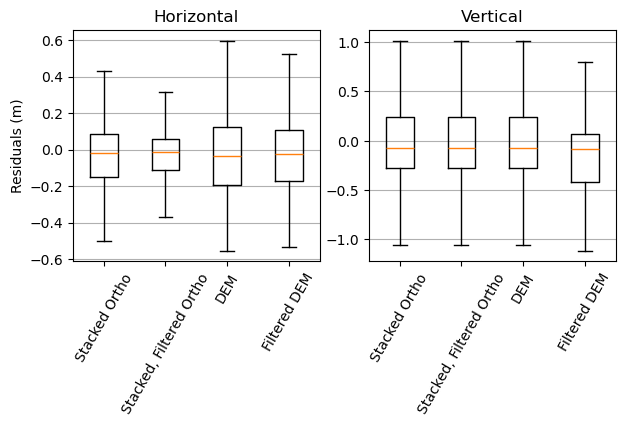

In [5]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(7,3))

# plot box plot
axs[0].boxplot(np.column_stack([stackedH,stackedFilteredH,demH,demFilteredH]),showfliers=False)
axs[0].set_title('Horizontal')
axs[1].boxplot(np.column_stack([stackedV,stackedFilteredV,demV,demFilteredV]),showfliers=False)
axs[1].set_title('Vertical')

# adding horizontal grid lines
for ax in axs:
    ax.yaxis.grid(True)
    ax.set_xticks([y + 1 for y in range(4)],
                  labels=['Stacked Ortho', 'Stacked, Filtered Ortho', 'DEM', 'Filtered DEM'],rotation=60)

axs[0].set_ylabel('Residuals (m)')

plt.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/ResidualBoxPlot.svg',transparent=True)
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from osgeo import gdal

folder = '/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/'

imfsxw = folder+'West/StackedFiltered/'+'EWDispStackedEPSG4326_bidenoise_filtered.tif'
imfsyw = folder+'West/StackedFiltered/'+'NSDispStackedEPSG4326_bidenoise_filtered.tif'
imfsxe = folder+'East/StackedFiltered/'+'EWDispStackedEPSG4326_bidenoise_filtered.tif'
imfsye = folder+'East/StackedFiltered/'+'NSDispStackedEPSG4326_bidenoise_filtered.tif'

imfmxw = folder+'West/Modeled/'+'WestdX-rioEPSG4326.tif'
imfmyw = folder+'West/Modeled/'+'WestdY-rioEPSG4326.tif'
imfmxe = folder+'East/Modeled/'+'EastdX-rioEPSG4326.tif'
imfmye = folder+'East/Modeled/'+'EastdY-rioEPSG4326.tif'

imfsxwdem = folder+'West/defaultsMECdemFiltered/'+'EWmicmacEPSG4326_bidenoise_filtered.tif'
imfsywdem = folder+'West/defaultsMECdemFiltered/'+'NSmicmacEPSG4326_bidenoise_filtered.tif'
imfsxedem = folder+'East/defaultsMECdemFiltered/'+'EWmicmacEPSG4326_bidenoise_filtered.tif'
imfsyedem = folder+'East/defaultsMECdemFiltered/'+'NSmicmacEPSG4326_bidenoise_filtered.tif'

imfszw = folder+'West/StackedFiltered/'+'UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'
imfsze = folder+'East/StackedFiltered/'+'UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'

imfszwdem = folder+'West/defaultsMECdemFiltered/'+'UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'
imfszedem = folder+'East/defaultsMECdemFiltered/'+'UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'

imfmzw = folder+'West/Modeled/'+'WestdZ-rioEPSG4326.tif'
imfmze = folder+'East/Modeled/'+'EastdZ-rioEPSG4326.tif'

corrfw = folder+'West/Stacked/'+'CorrelStackedEPSG4326.tif'
corrfe = folder+'East/Stacked/'+'CorrelStackedEPSG4326.tif'

corrfwdem = folder+'West/defaultsMECdem/'+'CorrelmicmacEPSG4326.tif'
corrfedem = folder+'East/defaultsMECdem/'+'CorrelmicmacEPSG4326.tif'

coverw = '/Volumes/ProjectsGarlockCSAF/Garlock/ESA_WORLDCOVER_10M_2021_V200/ESA_WorldCover_clippedGarlockWestAOI_10m.tif'
covere = '/Volumes/ProjectsGarlockCSAF/Garlock/ESA_WORLDCOVER_10M_2021_V200/ESA_WorldCover_clippedGarlockEastAOI_10m.tif'



# Land cover map and colorblind-friendly palette
landcover_names = {
    10: 'Trees',
    20: 'Shrubs',
    30: 'Grassland',
    50: 'Built-up',
    60: 'Barren'#,
    #80: 'Water' # ignore water, insufficient coverage
}
colors = ['#377eb8', '#e41a1c', '#4daf4a', '#ff7f00', '#984ea3']#, '#a65628']

for label in ['HOrtho','HDEM','VOrtho','VDEM']:

    if label.startswith('HO'):
        imhlist = [imfsxw, imfsyw, imfsxe, imfsye]
        immhlist = [imfmxw, imfmyw, imfmxe, imfmye]
        covlist = [coverw, coverw, covere, covere]
        corlist = [corrfw, corrfw, corrfe, corrfe]
    elif label.startswith('VO'):
        imhlist = [imfszw, imfsze]
        immhlist = [imfmzw, imfmze]
        covlist = [coverw, covere]
        corlist = [corrfw, corrfe]
    elif label.startswith('HD'):
        imhlist = [imfsxwdem, imfsywdem, imfsxedem, imfsyedem]
        immhlist = [imfmxw, imfmyw, imfmxe, imfmye]
        covlist = [coverw, coverw, covere, covere]
        corlist = [corrfwdem, corrfwdem, corrfedem, corrfedem]
    elif label.startswith('VD'):
        imhlist = [imfszwdem, imfszedem]
        immhlist = [imfmzw, imfmze]
        covlist = [coverw, covere]
        corlist = [corrfwdem, corrfedem]
    else:
        print('Something is wrong :/')

    # Define bins
    bin_width = 0.1
    bins = np.arange(0, 1 + bin_width, bin_width)

    # Prepare a dictionary to aggregate statistics across chunks
    bin_stats = {lc: {'bin_centers': bins[:-1] + bin_width / 2,  # Use bin centers
                      'mean_residuals': np.zeros(len(bins) - 1),
                      'std_residuals': np.zeros(len(bins) - 1),
                      'counts': np.zeros(len(bins) - 1)} for lc in landcover_names}

    # Process rasters incrementally
    for iml, imm, cm, cr in zip(imhlist, immhlist, covlist, corlist):
        im1 = gdal.Open(iml, gdal.GA_ReadOnly)
        im2 = gdal.Open(imm, gdal.GA_ReadOnly)
        cov = gdal.Open(cm, gdal.GA_ReadOnly)
        cor = gdal.Open(cr, gdal.GA_ReadOnly)

        pos_residuals = im1.GetRasterBand(1).ReadAsArray() - im2.GetRasterBand(1).ReadAsArray()
        pos_residuals = np.absolute(pos_residuals - np.mean(pos_residuals))
        cm_data, cr_data = cov.GetRasterBand(1).ReadAsArray(), cor.GetRasterBand(1).ReadAsArray()

        if label.endswith('Ortho'):
            correlations = cr_data / 4  # Normalize
        elif label.endswith('DEM'):
            correlations = cr_data  # No need to noremalize
        land_covers = cm_data

         # Create a temporary DataFrame for the current chunk
        temp_data = pd.DataFrame({
             'Correlation': correlations.flatten(),
             'Residual': pos_residuals.flatten(),
             'LandCover': land_covers.flatten()
         }).dropna()

         # Incrementally calculate statistics for each land cover class
        for lc_class in landcover_names:
            subset = temp_data[temp_data['LandCover'] == lc_class]
            if subset.empty:
                continue

            # Bin residuals by correlation score
            subset['bin'] = pd.cut(subset['Correlation'], bins, labels=False, include_lowest=True)
            for bin_idx in range(len(bins) - 1):
                bin_data = subset[subset['bin'] == bin_idx]
                if bin_data.empty:
                    continue

                # Accumulate statistics
                bin_stats[lc_class]['mean_residuals'][bin_idx] += np.sum(bin_data['Residual'])
                bin_stats[lc_class]['std_residuals'][bin_idx] += np.sum(bin_data['Residual']**2)
                bin_stats[lc_class]['counts'][bin_idx] += len(bin_data)

    # Finalize aggregated statistics
    for lc_class in bin_stats:
        counts = bin_stats[lc_class]['counts']
        bin_stats[lc_class]['mean_residuals'] /= np.maximum(counts, 1)  # Avoid division by zero
        bin_stats[lc_class]['std_residuals'] = np.sqrt(bin_stats[lc_class]['std_residuals'] / np.maximum(counts, 1))


    # Plot the results
    fig, axes = plt.subplots(5, 1, figsize=(2,8), sharex=True, sharey=True)
    plt.rcParams['font.family'] = 'Arial'
    plt.rcParams['font.size'] = 7
    axes = axes.flatten()

    for i, (lc_class, lc_name) in enumerate(landcover_names.items()):
        ax = axes[i]
        centers = bin_stats[lc_class]['bin_centers']
        means = bin_stats[lc_class]['mean_residuals']
        stds = bin_stats[lc_class]['std_residuals']
        counts = int(np.sum(bin_stats[lc_class]['counts']))  # Total data points for this land cover class
        
        if np.any(bin_stats[lc_class]['counts'] > 0):  # Only plot if data exists
            ax.errorbar(
                centers, means, yerr=stds, fmt='o', markersize=3,
                color=colors[i], ecolor='gray', capsize=3
            )

            # Overall mean and std lines
            overall_mean = np.mean(means)
            overall_std = np.mean(stds)
            n = np.sum(bin_stats[lc_class]['counts'])
            ax.axhline(overall_mean, color='gray', linestyle='-', linewidth=0.8, label='Overall Mean')
            ax.axhline(overall_mean + overall_std, color='gray', linestyle='--', linewidth=0.6, label='Mean ± Std')
            ax.axhline(overall_mean - overall_std, color='gray', linestyle='--', linewidth=0.6)
            if label.startswith('H'):
                ax.text(0.94,1.6,f'Overall Mean: {np.round(overall_mean,2)}±{np.round(overall_std,2)}\nN: {np.round(n)}',fontsize=6,
                    bbox=dict(facecolor='lightgray', edgecolor='black', alpha=0.7),horizontalalignment='right',)
            elif label.startswith('V'):
                ax.text(0.94,2.4,f'Overall Mean: {np.round(overall_mean,2)}±{np.round(overall_std,2)}\nN: {np.round(n)}',fontsize=6,
                    bbox=dict(facecolor='lightgray', edgecolor='black', alpha=0.7),horizontalalignment='right',)

        if label.startswith('HO'):
            ax.set_ylabel(lc_name, fontsize=8)
        ax.axhline(0, color='k', linewidth=0.8)  # Reference line at 0
        ax.set_xlim(0, 1)
        if label.startswith('V'):
            ax.set_ylim(-0.2, 3)
        if label.startswith('H'):
            ax.set_ylim(-0.2, 2)

    axes[-1].set_xlabel('Correlation Score', fontsize=8)
    fig.text(0.5,-0.02,'Correlation Score',fontsize=8,horizontalalignment='center', 
            verticalalignment='center')
    fig.text(-0.01,0.5,'Positive Residual (m)',fontsize=8,horizontalalignment='center', 
            verticalalignment='center',rotation=90)
    plt.tight_layout(pad=0)

    # Add legend for lines in the last subplot
    axes[-1].legend(fontsize=6, loc="upper right", frameon=False)

    # Set title and save individual plots
    if label.startswith('HO'):
        fig.suptitle('Horizontal Residuals (Ortho Correlation)', fontsize=10,y=1.02)
        plt.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/HorizontalOrthoResidualCorrelByLandCover.pdf', dpi=300)
    elif label.startswith('VO'):
        fig.suptitle('Vertical Residuals (Ortho Correlation)', fontsize=10,y=1.02)
        plt.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/VerticalOrthoResidualCorrelByLandCover.pdf', dpi=300)
    elif label.startswith('HD'):
        fig.suptitle('Horizontal Residuals (DEM Correlation)', fontsize=10,y=1.02)
        plt.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/HorizontalDEMResidualCorrelByLandCover.pdf', dpi=300)
    elif label.startswith('VD'):
        fig.suptitle('Vertical Residuals (DEM Correlation)', fontsize=10,y=1.02)
        plt.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/VerticalDEMResidualCorrelByLandCover.pdf', dpi=300)

    plt.show()

## Profiles

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rioxarray
from pyproj import Proj, Geod
import pygmt

P = Proj('epsg:32611')
G = Geod(ellps='WGS84')

In [2]:
dist = 500 # distance of line on one side of fault
start = []
end = []

pts = pd.read_csv('/Volumes/ProjectsGarlockCSAF/Garlock/GIS/EastPoints.csv')
pts.sort_values(by='Lon',inplace=True)

i = 10
az = G.inv(pts.iloc[i].Lon,pts.iloc[i].Lat,pts.iloc[i+1].Lon,pts.iloc[i+1].Lat)[0]-90 # Fault direction
start.append(G.fwd(pts.iloc[i].Lon,pts.iloc[i].Lat,az,dist)[0:2])
end.append(G.fwd(pts.iloc[i].Lon,pts.iloc[i].Lat,az+180,dist)[0:2])

i = 25
az = G.inv(pts.iloc[i].Lon,pts.iloc[i].Lat,pts.iloc[i+1].Lon,pts.iloc[i+1].Lat)[0]-90 # Fault direction
start.append(G.fwd(pts.iloc[i].Lon,pts.iloc[i].Lat,az,dist)[0:2])
end.append(G.fwd(pts.iloc[i].Lon,pts.iloc[i].Lat,az+180,dist)[0:2])

i = 40
az = G.inv(pts.iloc[i].Lon,pts.iloc[i].Lat,pts.iloc[i+1].Lon,pts.iloc[i+1].Lat)[0]-90 # Fault direction
start.append(G.fwd(pts.iloc[i].Lon,pts.iloc[i].Lat,az,dist)[0:2])
end.append(G.fwd(pts.iloc[i].Lon,pts.iloc[i].Lat,az+180,dist)[0:2])

pts = pd.read_csv('/Volumes/ProjectsGarlockCSAF/Garlock/GIS/WestPoints.csv')
pts['Lon'], pts['Lat'] = P(pts.Lon,pts.Lat,inverse=True)[0], P(pts.Lon,pts.Lat,inverse=True)[1]
pts.sort_values(by='Lon',inplace=True)

i = 10
az = G.inv(pts.iloc[i].Lon,pts.iloc[i].Lat,pts.iloc[i+1].Lon,pts.iloc[i+1].Lat)[0]-90 # Fault direction
start.append(G.fwd(pts.iloc[i].Lon,pts.iloc[i].Lat,az,dist)[0:2])
end.append(G.fwd(pts.iloc[i].Lon,pts.iloc[i].Lat,az+180,dist)[0:2])

i = 24
az = G.inv(pts.iloc[i].Lon,pts.iloc[i].Lat,pts.iloc[i+1].Lon,pts.iloc[i+1].Lat)[0]-90 # Fault direction
start.append(G.fwd(pts.iloc[i].Lon,pts.iloc[i].Lat,az,dist)[0:2])
end.append(G.fwd(pts.iloc[i].Lon,pts.iloc[i].Lat,az+180,dist)[0:2])

i = 35
az = G.inv(pts.iloc[i].Lon,pts.iloc[i].Lat,pts.iloc[i+1].Lon,pts.iloc[i+1].Lat)[0]-90 # Fault direction
start.append(G.fwd(pts.iloc[i].Lon,pts.iloc[i].Lat,az,dist)[0:2])
end.append(G.fwd(pts.iloc[i].Lon,pts.iloc[i].Lat,az+180,dist)[0:2])

start = np.array(start)
end = np.array(end)

/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/East/micmac/defaultsMECdem/EWmicmacEPSG4326.tif done
/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/East/micmac/defaultsMECdem/EWmicmacEPSG4326_bidenoise_filtered.tif done
/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/East/micmac/EWDispStackedEPSG4326.tif done
/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/East/micmac/EWDispStackedEPSG4326_bidenoise_filtered.tif done
/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/East/EastdX-rioEPSG4326.tif done
/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/West/micmac/defaultsMECdem/EWmicmacEPSG4326.tif done
/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/West/micmac/defaultsMECdem/EWmicmacEPSG4326_bidenoise_filtered.tif done
/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/West/micmac/EWDispStackedEPSG4326.tif done
/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/West/micmac/EWDispStackedEPSG4326_bidenoise_filtered.tif done
/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/West/WestdX-rioEP

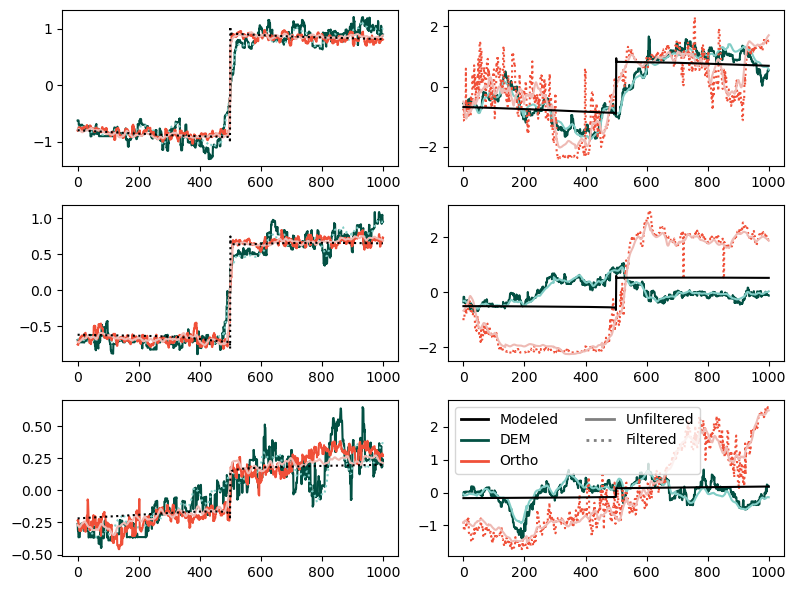

In [ ]:
imlist = [
'/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/East/micmac/defaultsMECdem/EWmicmacEPSG4326.tif',
'/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/East/micmac/defaultsMECdem/EWmicmacEPSG4326_bidenoise_filtered.tif',
'/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/East/micmac/EWDispStackedEPSG4326.tif',
'/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/East/micmac/EWDispStackedEPSG4326_bidenoise_filtered.tif',
'/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/East/EastdX-rioEPSG4326.tif',
'/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/West/micmac/defaultsMECdem/EWmicmacEPSG4326.tif',
'/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/West/micmac/defaultsMECdem/EWmicmacEPSG4326_bidenoise_filtered.tif',
'/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/West/micmac/EWDispStackedEPSG4326.tif',
'/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/West/micmac/EWDispStackedEPSG4326_bidenoise_filtered.tif',
'/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/West/WestdX-rioEPSG4326.tif'
]

colors = ['#025043','#81cdc6','#F05039','#EEBAB4','#000000']*2
linestyles = ['-','dotted','-','-','dotted','-']*2

fig, ax = plt.subplots(3,2,figsize=(8,6))
ax = ax.flatten()

for i in range(0,len(imlist)):
    # Open image
    im = imlist[i]

    if i <= 4:
        T = pygmt.grdtrack(im,profile=f'{start[0][0]}/{start[0][1]}/{end[0][0]}/{end[0][1]}+i0.5e+d',nodata=f'{-9999}')
        ax[0].plot(T[2], T[3]-T[3].mean(),color=colors[i],linestyle=linestyles[i])
        T = pygmt.grdtrack(im,profile=f'{start[1][0]}/{start[1][1]}/{end[1][0]}/{end[1][1]}+i0.5e+d',nodata=f'{-9999}')
        ax[2].plot(T[2], T[3]-T[3].mean(),color=colors[i],linestyle=linestyles[i])
        T = pygmt.grdtrack(im,profile=f'{start[2][0]}/{start[2][1]}/{end[2][0]}/{end[2][1]}+i0.5e+d',nodata=f'{-9999}')
        ax[4].plot(T[2], T[3]-T[3].mean(),color=colors[i],linestyle=linestyles[i])

    if i > 4:
        T = pygmt.grdtrack(im,profile=f'{start[3][0]}/{start[3][1]}/{end[3][0]}/{end[3][1]}+i0.5e+d',nodata=f'{-9999}')
        ax[1].plot(T[2], T[3]-T[3].mean(),color=colors[i],linestyle=linestyles[i])
        T = pygmt.grdtrack(im,profile=f'{start[4][0]}/{start[4][1]}/{end[4][0]}/{end[4][1]}+i0.5e+d',nodata=f'{-9999}')
        ax[3].plot(T[2], T[3]-T[3].mean(),color=colors[i],linestyle=linestyles[i])
        T = pygmt.grdtrack(im,profile=f'{start[5][0]}/{start[5][1]}/{end[5][0]}/{end[5][1]}+i0.5e+d',nodata=f'{-9999}')
        ax[5].plot(T[2], T[3]-T[3].mean(),color=colors[i],linestyle=linestyles[i])
    print(f'{imlist[i]} done')

from matplotlib.lines import Line2D
plt.legend([Line2D([0], [0], color='black',linestyle='-', lw=2),
            Line2D([0], [0], color='black',linestyle='dotted',lw=2)], 
           ['Unfiltered', 'Filtered'])
plt.legend([Line2D([0], [0], color='black',linestyle='-', lw=2),
            Line2D([0], [0], color=colors[0],linestyle='-',lw=2),
            Line2D([0], [0], color=colors[2],linestyle='-',lw=2),
            Line2D([0], [0], color='grey',linestyle='-', lw=2),
            Line2D([0], [0], color='grey',linestyle='dotted',lw=2)], 
           ['Modeled', 'DEM','Ortho','Unfiltered','Filtered'],
           ncols=2)
plt.tight_layout()
    
#plt.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/ThreeProfileComparison1km.svg')

/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/East/micmac/defaultsMECdem/EWmicmacEPSG4326.tif done
/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/East/micmac/defaultsMECdem/EWmicmacEPSG4326_bidenoise_filtered.tif done
/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/East/micmac/EWDispStackedEPSG4326.tif done
/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/East/micmac/EWDispStackedEPSG4326_bidenoise_filtered.tif done
/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/East/EastdX-rioEPSG4326.tif done
/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/West/micmac/defaultsMECdem/EWmicmacEPSG4326.tif done
/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/West/micmac/defaultsMECdem/EWmicmacEPSG4326_bidenoise_filtered.tif done
/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/West/micmac/EWDispStackedEPSG4326.tif done
/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/West/micmac/EWDispStackedEPSG4326_bidenoise_filtered.tif done
/Volumes/ProjectsGarlockCSAF/Garlock/Deformation/West/WestdX-rioEP

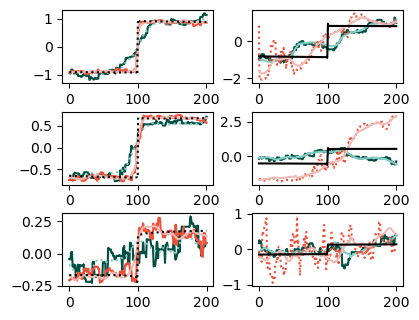

In [42]:
dist = 100 # distance of line on one side of fault
start = []
end = []

pts = pd.read_csv('/Volumes/ProjectsGarlockCSAF/Garlock/GIS/EastPoints.csv')
pts.sort_values(by='Lon',inplace=True)

i = 10
az = G.inv(pts.iloc[i].Lon,pts.iloc[i].Lat,pts.iloc[i+1].Lon,pts.iloc[i+1].Lat)[0]-90 # Fault direction
start.append(G.fwd(pts.iloc[i].Lon,pts.iloc[i].Lat,az,dist)[0:2])
end.append(G.fwd(pts.iloc[i].Lon,pts.iloc[i].Lat,az+180,dist)[0:2])

i = 25
az = G.inv(pts.iloc[i].Lon,pts.iloc[i].Lat,pts.iloc[i+1].Lon,pts.iloc[i+1].Lat)[0]-90 # Fault direction
start.append(G.fwd(pts.iloc[i].Lon,pts.iloc[i].Lat,az,dist)[0:2])
end.append(G.fwd(pts.iloc[i].Lon,pts.iloc[i].Lat,az+180,dist)[0:2])

i = 40
az = G.inv(pts.iloc[i].Lon,pts.iloc[i].Lat,pts.iloc[i+1].Lon,pts.iloc[i+1].Lat)[0]-90 # Fault direction
start.append(G.fwd(pts.iloc[i].Lon,pts.iloc[i].Lat,az,dist)[0:2])
end.append(G.fwd(pts.iloc[i].Lon,pts.iloc[i].Lat,az+180,dist)[0:2])

pts = pd.read_csv('/Volumes/ProjectsGarlockCSAF/Garlock/GIS/WestPoints.csv')
pts['Lon'], pts['Lat'] = P(pts.Lon,pts.Lat,inverse=True)[0], P(pts.Lon,pts.Lat,inverse=True)[1]
pts.sort_values(by='Lon',inplace=True)

i = 10
az = G.inv(pts.iloc[i].Lon,pts.iloc[i].Lat,pts.iloc[i+1].Lon,pts.iloc[i+1].Lat)[0]-90 # Fault direction
start.append(G.fwd(pts.iloc[i].Lon,pts.iloc[i].Lat,az,dist)[0:2])
end.append(G.fwd(pts.iloc[i].Lon,pts.iloc[i].Lat,az+180,dist)[0:2])

i = 24
az = G.inv(pts.iloc[i].Lon,pts.iloc[i].Lat,pts.iloc[i+1].Lon,pts.iloc[i+1].Lat)[0]-90 # Fault direction
start.append(G.fwd(pts.iloc[i].Lon,pts.iloc[i].Lat,az,dist)[0:2])
end.append(G.fwd(pts.iloc[i].Lon,pts.iloc[i].Lat,az+180,dist)[0:2])

i = 35
az = G.inv(pts.iloc[i].Lon,pts.iloc[i].Lat,pts.iloc[i+1].Lon,pts.iloc[i+1].Lat)[0]-90 # Fault direction
start.append(G.fwd(pts.iloc[i].Lon,pts.iloc[i].Lat,az,dist)[0:2])
end.append(G.fwd(pts.iloc[i].Lon,pts.iloc[i].Lat,az+180,dist)[0:2])

start = np.array(start)
end = np.array(end)

fig, ax = plt.subplots(3,2,figsize=(4,3))
ax = ax.flatten()

for i in range(0,len(imlist)):
    # Open image
    im = imlist[i]

    if i <= 4:
        T = pygmt.grdtrack(im,profile=f'{start[0][0]}/{start[0][1]}/{end[0][0]}/{end[0][1]}+i0.5e+d',nodata=f'{-9999}')
        ax[0].plot(T[2], T[3]-T[3].mean(),color=colors[i],linestyle=linestyles[i])
        T = pygmt.grdtrack(im,profile=f'{start[1][0]}/{start[1][1]}/{end[1][0]}/{end[1][1]}+i0.5e+d',nodata=f'{-9999}')
        ax[2].plot(T[2], T[3]-T[3].mean(),color=colors[i],linestyle=linestyles[i])
        T = pygmt.grdtrack(im,profile=f'{start[2][0]}/{start[2][1]}/{end[2][0]}/{end[2][1]}+i0.5e+d',nodata=f'{-9999}')
        ax[4].plot(T[2], T[3]-T[3].mean(),color=colors[i],linestyle=linestyles[i])

    if i > 4:
        T = pygmt.grdtrack(im,profile=f'{start[3][0]}/{start[3][1]}/{end[3][0]}/{end[3][1]}+i0.5e+d',nodata=f'{-9999}')
        ax[1].plot(T[2], T[3]-T[3].mean(),color=colors[i],linestyle=linestyles[i])
        T = pygmt.grdtrack(im,profile=f'{start[4][0]}/{start[4][1]}/{end[4][0]}/{end[4][1]}+i0.5e+d',nodata=f'{-9999}')
        ax[3].plot(T[2], T[3]-T[3].mean(),color=colors[i],linestyle=linestyles[i])
        T = pygmt.grdtrack(im,profile=f'{start[5][0]}/{start[5][1]}/{end[5][0]}/{end[5][1]}+i0.5e+d',nodata=f'{-9999}')
        ax[5].plot(T[2], T[3]-T[3].mean(),color=colors[i],linestyle=linestyles[i])
    print(f'{imlist[i]} done')


plt.tight_layout(pad=0)
    
plt.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/ThreeProfileComparison200m.svg')

# Slope Comparison

In [1]:
import rioxarray
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
#
STOP
#!/bin/bash

# -117.0256160 35.5599268 -116.8999914 35.6439349
# -118.8034300 34.8483900 -118.6959000 34.9256900

gdalwarp -t_srs EPSG:4326 -overwrite -te -118.8034300 34.8483900 -118.6959000 34.9256900 -tr 0.000004987476809 -0.000004987418543 -r near -of GTiff -ot Float32 /Volumes/ProjectsGarlockCSAF/Garlock/Deformation/West/micmac/2019GarlockWestDEM-cropped-f32.tif /Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/DEMs/2019GarlockWestDEM.tif
gdaldem slope -alg horn -s 111120 /Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/DEMs/2019GarlockWestDEM.tif /Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/DEMs/2019GarlockWestDEM-slope.tif

gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.5599268 -116.8999914 35.6439349 -tr 0.000004987476809 -0.000004987418543 -r near -of GTiff -ot Float32 /Volumes/ProjectsGarlockCSAF/Garlock/Deformation/East/micmac/2020GarlockEastDEM-cropped-f32.tif /Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/DEMs/2020GarlockEastDEM.tif
gdaldem slope -alg horn -s 111120 /Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/DEMs/2020GarlockEastDEM.tif /Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/DEMs/2020GarlockEastDEM-slope.tif

bash: line 1: STOP: command not found


Creating output file that is 21560P x 15499L.
Using internal nodata values (e.g. 0) for image /Volumes/ProjectsGarlockCSAF/Garlock/Deformation/West/micmac/2019GarlockWestDEM-cropped-f32.tif.
Copying nodata values from source /Volumes/ProjectsGarlockCSAF/Garlock/Deformation/West/micmac/2019GarlockWestDEM-cropped-f32.tif to destination /Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/DEMs/2019GarlockWestDEM.tif.
Processing /Volumes/ProjectsGarlockCSAF/Garlock/Deformation/West/micmac/2019GarlockWestDEM-cropped-f32.tif [1/1] : 0...10...20...30...Process is interrupted.


In [ ]:
0.000004987476809*20, 0.00009974953618

9.974953618e-05

In [26]:
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.8034300 34.8483900 -118.6959000 34.9256900 -tr 0.00009974953618 -0.00009974953618 -r near -of GTiff -ot Float32 /Volumes/ProjectsGarlockCSAF/Garlock/Deformation/West/micmac/2019GarlockWestDEM-cropped-f32.tif /Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/DEMs/2019GarlockWestDEM10m.tif
#!gdaldem slope -alg horn -s 111120 /Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/DEMs/2019GarlockWestDEM10m.tif /Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/DEMs/2019GarlockWestDEM-slope.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.8034300 34.8483900 -118.6959000 34.9256900 -tr 0.000004987476809 -0.000004987476809 -r near -of GTiff -ot Float32 /Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/DEMs/2019GarlockWestDEM-slope.tif /Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/DEMs/2019GarlockWestDEM-slope10mTo50cm.tif
!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.5599268 -116.8999914 35.6439349 -tr 0.00009974953618 -0.00009974953618 -r near -of GTiff -ot Float32 /Volumes/ProjectsGarlockCSAF/Garlock/Deformation/East/micmac/2020GarlockEastDEM-cropped-f32.tif /Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/DEMs/2020GarlockEastDEM10m.tif
!gdaldem slope -alg horn -s 111120 /Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/DEMs/2020GarlockEastDEM10m.tif /Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/DEMs/2020GarlockEastDEM-slope.tif
!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.5599268 -116.8999914 35.6439349 -tr 0.000004987476809 -0.000004987476809 -r near -of GTiff -ot Float32 /Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/DEMs/2020GarlockEastDEM-slope.tif /Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/DEMs/2020GarlockEastDEM-slope10mTo50cm.tif


Creating output file that is 1259P x 842L.
Using internal nodata values (e.g. 0) for image /Volumes/ProjectsGarlockCSAF/Garlock/Deformation/East/micmac/2020GarlockEastDEM-cropped-f32.tif.
Copying nodata values from source /Volumes/ProjectsGarlockCSAF/Garlock/Deformation/East/micmac/2020GarlockEastDEM-cropped-f32.tif to destination /Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/DEMs/2020GarlockEastDEM10m.tif.
Processing /Volumes/ProjectsGarlockCSAF/Garlock/Deformation/East/micmac/2020GarlockEastDEM-cropped-f32.tif [1/1] : 0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.
Creating output file that is 25188P x 16844L.
Using internal nodata values (e.g. -9999) for image /Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/DEMs/2020GarlockEastDEM-slope.tif.
Copying nodata values from source /Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/DEMs/2020GarlockEastDEM-slope.tif to destination /Volumes/Projects

In [27]:
# horizontals, both regions, modeled
modWew = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/Modeled/WestdX-rioEPSG4326.tif')
modWns = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/Modeled/WestdY-rioEPSG4326.tif')
modEew = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/Modeled/EastdX-rioEPSG4326.tif')
modEns = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/Modeled/EastdY-rioEPSG4326.tif')

# horizontals, both regions, stacked
Eslope = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/DEMs/2020GarlockEastDEM-slope10mTo50cm.tif')
Wslope = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/DEMs/2019GarlockWestDEM-slope10mTo50cm.tif')

stackedSlope = np.hstack([Eslope.data.flatten(),Eslope.data.flatten(),Wslope.data.flatten(),Wslope.data.flatten()])

Eslope = None; Wslope = None

# horizontals, both regions, stacked, filtered
stackedEew = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/StackedFiltered/EWDispStackedEPSG4326_bidenoise_filtered.tif') 
stackedEew = np.sqrt((modEew -stackedEew)**2) - np.mean(np.sqrt((modEew -stackedEew)**2))
stackedEns = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/East/StackedFiltered/NSDispStackedEPSG4326_bidenoise_filtered.tif')
stackedEns = np.sqrt((modEns -stackedEns)**2) - np.mean(np.sqrt((modEns -stackedEns)**2))
stackedWew = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/StackedFiltered/EWDispStackedEPSG4326_bidenoise_filtered.tif') 
stackedWew = np.sqrt((modWew -stackedWew)**2) - np.mean(np.sqrt((modWew -stackedWew)**2))
stackedWns = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/West/StackedFiltered/NSDispStackedEPSG4326_bidenoise_filtered.tif')
stackedWns = np.sqrt((modWns -stackedWns)**2) - np.mean(np.sqrt((modWew -stackedWns)**2))


stackedFilteredH = np.hstack([stackedEew.data.flatten(),stackedEns.data.flatten(),stackedWew.data.flatten(),stackedWns.data.flatten()])

stackedEew = None; stackedEns = None; stackedWew = None; stackedWns = None

modWew = None ;modWns = None ;modEew = None ;modEns = None

In [30]:
from scipy.stats import spearmanr
correlation, p_value = spearmanr(stackedSlope,stackedFilteredH)
correlation, p_value

In [31]:
correlation, p_value

(np.float64(-0.08641113015322661), np.float64(0.0))

(10.0, 90.0)

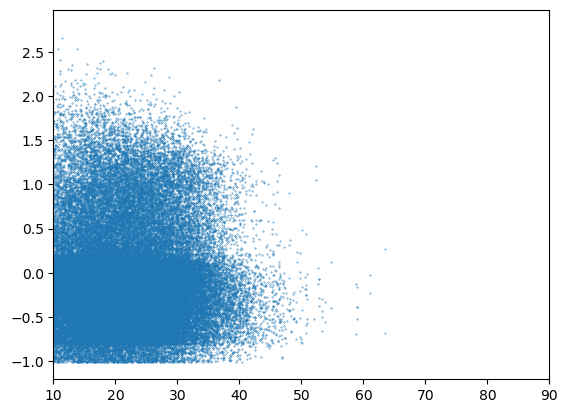

In [32]:
plt.scatter(stackedSlope[::10000],stackedFilteredH[::10000],s=0.1)
#plt.ylim(-0.5,0.5)
plt.xlim(10,90)

/var/folders/zn/w54gt7k11csfs1n4z8r3xccsyqhmjz/T/ipykernel_29006/547669286.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['bin'] = pd.cut(subset['Correlation'], bins, labels=False, include_lowest=True)
/var/folders/zn/w54gt7k11csfs1n4z8r3xccsyqhmjz/T/ipykernel_29006/547669286.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['bin'] = pd.cut(subset['Correlation'], bins, labels=False, include_lowest=True)
/var/folders/zn/w54gt7k11csfs1n4z8r3xccsyqhmjz/T/ipykernel_29006/547669286.py:12

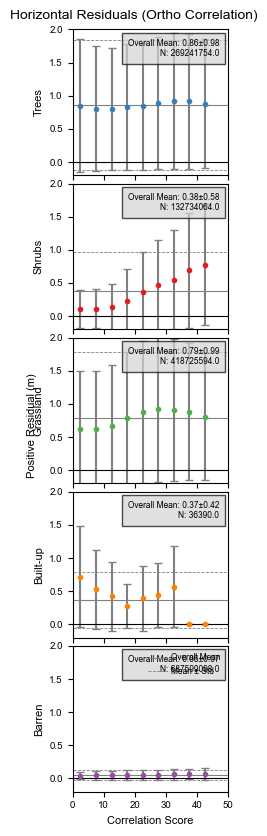

/var/folders/zn/w54gt7k11csfs1n4z8r3xccsyqhmjz/T/ipykernel_29006/547669286.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['bin'] = pd.cut(subset['Correlation'], bins, labels=False, include_lowest=True)
/var/folders/zn/w54gt7k11csfs1n4z8r3xccsyqhmjz/T/ipykernel_29006/547669286.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['bin'] = pd.cut(subset['Correlation'], bins, labels=False, include_lowest=True)
/var/folders/zn/w54gt7k11csfs1n4z8r3xccsyqhmjz/T/ipykernel_29006/547669286.py:12

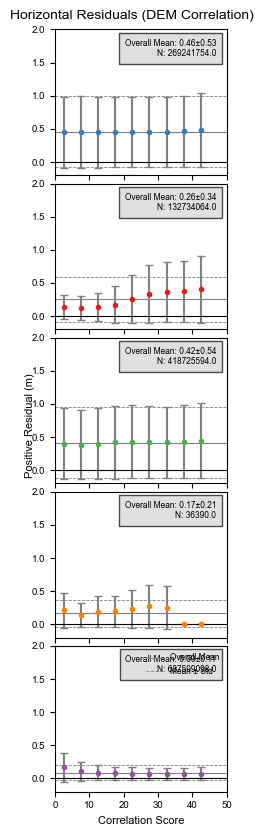

/var/folders/zn/w54gt7k11csfs1n4z8r3xccsyqhmjz/T/ipykernel_29006/547669286.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['bin'] = pd.cut(subset['Correlation'], bins, labels=False, include_lowest=True)
/var/folders/zn/w54gt7k11csfs1n4z8r3xccsyqhmjz/T/ipykernel_29006/547669286.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['bin'] = pd.cut(subset['Correlation'], bins, labels=False, include_lowest=True)
/var/folders/zn/w54gt7k11csfs1n4z8r3xccsyqhmjz/T/ipykernel_29006/547669286.py:12

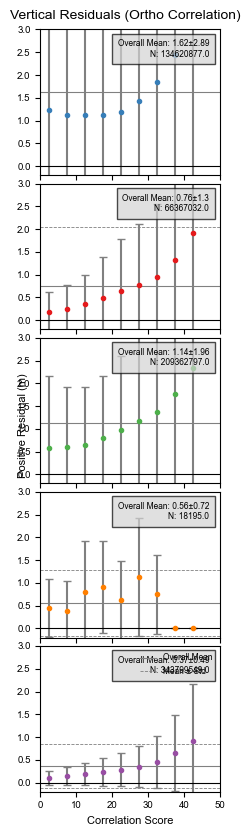

/var/folders/zn/w54gt7k11csfs1n4z8r3xccsyqhmjz/T/ipykernel_29006/547669286.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['bin'] = pd.cut(subset['Correlation'], bins, labels=False, include_lowest=True)
/var/folders/zn/w54gt7k11csfs1n4z8r3xccsyqhmjz/T/ipykernel_29006/547669286.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['bin'] = pd.cut(subset['Correlation'], bins, labels=False, include_lowest=True)
/var/folders/zn/w54gt7k11csfs1n4z8r3xccsyqhmjz/T/ipykernel_29006/547669286.py:12

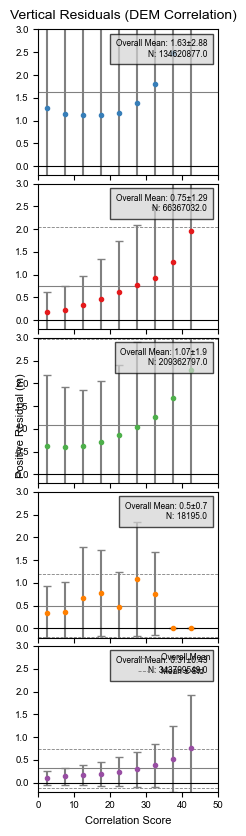

In [15]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from osgeo import gdal

folder = '/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/'

imfsxw = folder+'West/StackedFiltered/'+'EWDispStackedEPSG4326_bidenoise_filtered.tif'
imfsyw = folder+'West/StackedFiltered/'+'NSDispStackedEPSG4326_bidenoise_filtered.tif'
imfsxe = folder+'East/StackedFiltered/'+'EWDispStackedEPSG4326_bidenoise_filtered.tif'
imfsye = folder+'East/StackedFiltered/'+'NSDispStackedEPSG4326_bidenoise_filtered.tif'

imfmxw = folder+'West/Modeled/'+'WestdX-rioEPSG4326.tif'
imfmyw = folder+'West/Modeled/'+'WestdY-rioEPSG4326.tif'
imfmxe = folder+'East/Modeled/'+'EastdX-rioEPSG4326.tif'
imfmye = folder+'East/Modeled/'+'EastdY-rioEPSG4326.tif'

imfsxwdem = folder+'West/defaultsMECdemFiltered/'+'EWmicmacEPSG4326_bidenoise_filtered.tif'
imfsywdem = folder+'West/defaultsMECdemFiltered/'+'NSmicmacEPSG4326_bidenoise_filtered.tif'
imfsxedem = folder+'East/defaultsMECdemFiltered/'+'EWmicmacEPSG4326_bidenoise_filtered.tif'
imfsyedem = folder+'East/defaultsMECdemFiltered/'+'NSmicmacEPSG4326_bidenoise_filtered.tif'

imfszw = folder+'West/StackedFiltered/'+'UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'
imfsze = folder+'East/StackedFiltered/'+'UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'

imfszwdem = folder+'West/defaultsMECdemFiltered/'+'UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'
imfszedem = folder+'East/defaultsMECdemFiltered/'+'UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'

imfmzw = folder+'West/Modeled/'+'WestdZ-rioEPSG4326.tif'
imfmze = folder+'East/Modeled/'+'EastdZ-rioEPSG4326.tif'

corrfe = folder+'/East/DEMs/2020GarlockEastDEM-slope10mTo50cm.tif'
corrfw = folder+'/West/DEMs/2019GarlockWestDEM-slope10mTo50cm.tif'

corrfedem = folder+'/East/DEMs/2020GarlockEastDEM-slope10mTo50cm.tif'
corrfwdem = folder+'/West/DEMs/2019GarlockWestDEM-slope10mTo50cm.tif'

coverw = '/Volumes/ProjectsGarlockCSAF/Garlock/ESA_WORLDCOVER_10M_2021_V200/ESA_WorldCover_clippedGarlockWestAOI_10m.tif'
covere = '/Volumes/ProjectsGarlockCSAF/Garlock/ESA_WORLDCOVER_10M_2021_V200/ESA_WorldCover_clippedGarlockEastAOI_10m.tif'



# Land cover map and colorblind-friendly palette
landcover_names = {
    10: 'Trees',
    20: 'Shrubs',
    30: 'Grassland',
    50: 'Built-up',
    60: 'Barren'#,
    #80: 'Water' # ignore water, insufficient coverage
}
colors = ['#377eb8', '#e41a1c', '#4daf4a', '#ff7f00', '#984ea3']#, '#a65628']

for label in ['HOrtho','HDEM','VOrtho','VDEM']:

    if label.startswith('HO'):
        imhlist = [imfsxw, imfsyw, imfsxe, imfsye]
        immhlist = [imfmxw, imfmyw, imfmxe, imfmye]
        covlist = [coverw, coverw, covere, covere]
        corlist = [corrfw, corrfw, corrfe, corrfe]
    elif label.startswith('VO'):
        imhlist = [imfszw, imfsze]
        immhlist = [imfmzw, imfmze]
        covlist = [coverw, covere]
        corlist = [corrfw, corrfe]
    elif label.startswith('HD'):
        imhlist = [imfsxwdem, imfsywdem, imfsxedem, imfsyedem]
        immhlist = [imfmxw, imfmyw, imfmxe, imfmye]
        covlist = [coverw, coverw, covere, covere]
        corlist = [corrfwdem, corrfwdem, corrfedem, corrfedem]
    elif label.startswith('VD'):
        imhlist = [imfszwdem, imfszedem]
        immhlist = [imfmzw, imfmze]
        covlist = [coverw, covere]
        corlist = [corrfwdem, corrfedem]
    else:
        print('Something is wrong :/')

    # Define bins
    bin_width = 5
    bins = np.arange(0, 50, bin_width)

    # Prepare a dictionary to aggregate statistics across chunks
    bin_stats = {lc: {'bin_centers': bins[:-1] + bin_width / 2,  # Use bin centers
                      'mean_residuals': np.zeros(len(bins) - 1),
                      'std_residuals': np.zeros(len(bins) - 1),
                      'counts': np.zeros(len(bins) - 1)} for lc in landcover_names}

    # Process rasters incrementally
    for iml, imm, cm, cr in zip(imhlist, immhlist, covlist, corlist):
        im1 = gdal.Open(iml, gdal.GA_ReadOnly)
        im2 = gdal.Open(imm, gdal.GA_ReadOnly)
        cov = gdal.Open(cm, gdal.GA_ReadOnly)
        cor = gdal.Open(cr, gdal.GA_ReadOnly)

        pos_residuals = im1.GetRasterBand(1).ReadAsArray() - im2.GetRasterBand(1).ReadAsArray()
        pos_residuals = np.absolute(pos_residuals - np.mean(pos_residuals))
        cm_data, cr_data = cov.GetRasterBand(1).ReadAsArray(), cor.GetRasterBand(1).ReadAsArray()

        if label.endswith('Ortho'):
            correlations = cr_data   # Normalize
        elif label.endswith('DEM'):
            correlations = cr_data  # No need to noremalize
        land_covers = cm_data

         # Create a temporary DataFrame for the current chunk
        temp_data = pd.DataFrame({
             'Correlation': correlations.flatten(),
             'Residual': pos_residuals.flatten(),
             'LandCover': land_covers.flatten()
         }).dropna()

         # Incrementally calculate statistics for each land cover class
        for lc_class in landcover_names:
            subset = temp_data[temp_data['LandCover'] == lc_class]
            if subset.empty:
                continue

            # Bin residuals by correlation score
            subset['bin'] = pd.cut(subset['Correlation'], bins, labels=False, include_lowest=True)
            for bin_idx in range(len(bins) - 1):
                bin_data = subset[subset['bin'] == bin_idx]
                if bin_data.empty:
                    continue

                # Accumulate statistics
                bin_stats[lc_class]['mean_residuals'][bin_idx] += np.sum(bin_data['Residual'])
                bin_stats[lc_class]['std_residuals'][bin_idx] += np.sum(bin_data['Residual']**2)
                bin_stats[lc_class]['counts'][bin_idx] += len(bin_data)

    # Finalize aggregated statistics
    for lc_class in bin_stats:
        counts = bin_stats[lc_class]['counts']
        bin_stats[lc_class]['mean_residuals'] /= np.maximum(counts, 1)  # Avoid division by zero
        bin_stats[lc_class]['std_residuals'] = np.sqrt(bin_stats[lc_class]['std_residuals'] / np.maximum(counts, 1))


    # Plot the results
    fig, axes = plt.subplots(5, 1, figsize=(2,8), sharex=True, sharey=True)
    plt.rcParams['font.family'] = 'Arial'
    plt.rcParams['font.size'] = 7
    axes = axes.flatten()

    for i, (lc_class, lc_name) in enumerate(landcover_names.items()):
        ax = axes[i]
        centers = bin_stats[lc_class]['bin_centers']
        means = bin_stats[lc_class]['mean_residuals']
        stds = bin_stats[lc_class]['std_residuals']
        counts = int(np.sum(bin_stats[lc_class]['counts']))  # Total data points for this land cover class
        
        if np.any(bin_stats[lc_class]['counts'] > 0):  # Only plot if data exists
            ax.errorbar(
                centers, means, yerr=stds, fmt='o', markersize=3,
                color=colors[i], ecolor='gray', capsize=3
            )

            # Overall mean and std lines
            overall_mean = np.mean(means)
            overall_std = np.mean(stds)
            n = np.sum(bin_stats[lc_class]['counts'])
            ax.axhline(overall_mean, color='gray', linestyle='-', linewidth=0.8, label='Overall Mean')
            ax.axhline(overall_mean + overall_std, color='gray', linestyle='--', linewidth=0.6, label='Mean ± Std')
            ax.axhline(overall_mean - overall_std, color='gray', linestyle='--', linewidth=0.6)
            if label.startswith('H'):
                ax.text(47,1.6,f'Overall Mean: {np.round(overall_mean,2)}±{np.round(overall_std,2)}\nN: {np.round(n)}',fontsize=6,
                    bbox=dict(facecolor='lightgray', edgecolor='black', alpha=0.7),horizontalalignment='right',)
            elif label.startswith('V'):
                ax.text(47,2.4,f'Overall Mean: {np.round(overall_mean,2)}±{np.round(overall_std,2)}\nN: {np.round(n)}',fontsize=6,
                    bbox=dict(facecolor='lightgray', edgecolor='black', alpha=0.7),horizontalalignment='right',)

        if label.startswith('HO'):
            ax.set_ylabel(lc_name, fontsize=8)
        ax.axhline(0, color='k', linewidth=0.8)  # Reference line at 0
        ax.set_xlim(0, 50)
        if label.startswith('V'):
            ax.set_ylim(-0.2, 3)
        if label.startswith('H'):
            ax.set_ylim(-0.2, 2)

    axes[-1].set_xlabel('Correlation Score', fontsize=8)

    fig.text(-0.01,0.5,'Positive Residual (m)',fontsize=8,horizontalalignment='center', 
            verticalalignment='center',rotation=90)
    plt.tight_layout(pad=0)

    # Add legend for lines in the last subplot
    axes[-1].legend(fontsize=6, loc="upper right", frameon=False)

    # Set title and save individual plots
    if label.startswith('HO'):
        fig.suptitle('Horizontal Residuals (Ortho Correlation)', fontsize=10,y=1.02)
        plt.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/HorizontalOrthoResidualSlopeByLandCover.pdf', dpi=300)
    elif label.startswith('VO'):
        fig.suptitle('Vertical Residuals (Ortho Correlation)', fontsize=10,y=1.02)
        plt.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/VerticalOrthoResidualSlopeByLandCover.pdf', dpi=300)
    elif label.startswith('HD'):
        fig.suptitle('Horizontal Residuals (DEM Correlation)', fontsize=10,y=1.02)
        plt.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/HorizontalDEMResidualSlopeByLandCover.pdf', dpi=300)
    elif label.startswith('VD'):
        fig.suptitle('Vertical Residuals (DEM Correlation)', fontsize=10,y=1.02)
        plt.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/VerticalDEMResidualSlopeByLandCover.pdf', dpi=300)

    plt.show()

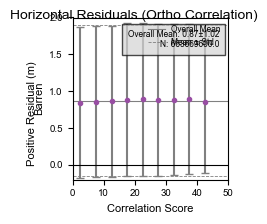

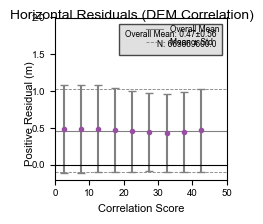

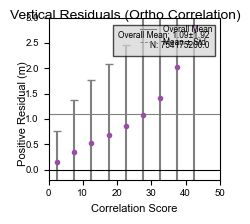

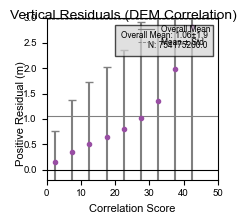

In [22]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from osgeo import gdal

folder = '/Volumes/ProjectsGarlockCSAF/Garlock/FinalRasters/'

imfsxw = folder+'West/StackedFiltered/'+'EWDispStackedEPSG4326_bidenoise_filtered.tif'
imfsyw = folder+'West/StackedFiltered/'+'NSDispStackedEPSG4326_bidenoise_filtered.tif'
imfsxe = folder+'East/StackedFiltered/'+'EWDispStackedEPSG4326_bidenoise_filtered.tif'
imfsye = folder+'East/StackedFiltered/'+'NSDispStackedEPSG4326_bidenoise_filtered.tif'

imfmxw = folder+'West/Modeled/'+'WestdX-rioEPSG4326.tif'
imfmyw = folder+'West/Modeled/'+'WestdY-rioEPSG4326.tif'
imfmxe = folder+'East/Modeled/'+'EastdX-rioEPSG4326.tif'
imfmye = folder+'East/Modeled/'+'EastdY-rioEPSG4326.tif'

imfsxwdem = folder+'West/defaultsMECdemFiltered/'+'EWmicmacEPSG4326_bidenoise_filtered.tif'
imfsywdem = folder+'West/defaultsMECdemFiltered/'+'NSmicmacEPSG4326_bidenoise_filtered.tif'
imfsxedem = folder+'East/defaultsMECdemFiltered/'+'EWmicmacEPSG4326_bidenoise_filtered.tif'
imfsyedem = folder+'East/defaultsMECdemFiltered/'+'NSmicmacEPSG4326_bidenoise_filtered.tif'

imfszw = folder+'West/StackedFiltered/'+'UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'
imfsze = folder+'East/StackedFiltered/'+'UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'

imfszwdem = folder+'West/defaultsMECdemFiltered/'+'UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'
imfszedem = folder+'East/defaultsMECdemFiltered/'+'UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'

imfmzw = folder+'West/Modeled/'+'WestdZ-rioEPSG4326.tif'
imfmze = folder+'East/Modeled/'+'EastdZ-rioEPSG4326.tif'

corrfe = folder+'/East/DEMs/2020GarlockEastDEM-slope10mTo50cm.tif'
corrfw = folder+'/West/DEMs/2019GarlockWestDEM-slope10mTo50cm.tif'

corrfedem = folder+'/East/DEMs/2020GarlockEastDEM-slope10mTo50cm.tif'
corrfwdem = folder+'/West/DEMs/2019GarlockWestDEM-slope10mTo50cm.tif'

for label in ['HOrtho','HDEM','VOrtho','VDEM']:

    if label.startswith('HO'):
        imhlist = [imfsxw, imfsyw, imfsxe, imfsye]
        immhlist = [imfmxw, imfmyw, imfmxe, imfmye]
        corlist = [corrfw, corrfw, corrfe, corrfe]
    elif label.startswith('VO'):
        imhlist = [imfszw, imfsze]
        immhlist = [imfmzw, imfmze]
        covlist = [coverw, covere]
        corlist = [corrfw, corrfe]
    elif label.startswith('HD'):
        imhlist = [imfsxwdem, imfsywdem, imfsxedem, imfsyedem]
        immhlist = [imfmxw, imfmyw, imfmxe, imfmye]
        corlist = [corrfwdem, corrfwdem, corrfedem, corrfedem]
    elif label.startswith('VD'):
        imhlist = [imfszwdem, imfszedem]
        immhlist = [imfmzw, imfmze]
        corlist = [corrfwdem, corrfedem]
    else:
        print('Something is wrong :/')

    # Define bins
    bin_width = 5
    bins = np.arange(0, 50, bin_width)

    # Prepare a dictionary to aggregate statistics across chunks
    bin_stats = {'bin_centers': bins[:-1] + bin_width / 2,  # Use bin centers
                      'mean_residuals': np.zeros(len(bins) - 1),
                      'std_residuals': np.zeros(len(bins) - 1),
                      'counts': np.zeros(len(bins) - 1)}

    # Process rasters incrementally
    for iml, imm, cm, cr in zip(imhlist, immhlist, covlist, corlist):
        im1 = gdal.Open(iml, gdal.GA_ReadOnly)
        im2 = gdal.Open(imm, gdal.GA_ReadOnly)
        cov = gdal.Open(cm, gdal.GA_ReadOnly)
        cor = gdal.Open(cr, gdal.GA_ReadOnly)

        pos_residuals = im1.GetRasterBand(1).ReadAsArray() - im2.GetRasterBand(1).ReadAsArray()
        pos_residuals = np.absolute(pos_residuals - np.mean(pos_residuals))
        cm_data, cr_data = cov.GetRasterBand(1).ReadAsArray(), cor.GetRasterBand(1).ReadAsArray()

        if label.endswith('Ortho'):
            correlations = cr_data   # Normalize
        elif label.endswith('DEM'):
            correlations = cr_data  # No need to noremalize
        land_covers = cm_data

         # Create a temporary DataFrame for the current chunk
        temp_data = pd.DataFrame({
             'Correlation': correlations.flatten(),
             'Residual': pos_residuals.flatten()
         }).dropna()

        subset = temp_data

        # Bin residuals by correlation score
        subset['bin'] = pd.cut(subset['Correlation'], bins, labels=False, include_lowest=True)
        for bin_idx in range(len(bins) - 1):
            bin_data = subset[subset['bin'] == bin_idx]
            if bin_data.empty:
                continue

            # Accumulate statistics
            bin_stats['mean_residuals'][bin_idx] += np.sum(bin_data['Residual'])
            bin_stats['std_residuals'][bin_idx] += np.sum(bin_data['Residual']**2)
            bin_stats['counts'][bin_idx] += len(bin_data)

    # Finalize aggregated statistics

    counts = bin_stats['counts']
    bin_stats['mean_residuals'] /= np.maximum(counts, 1)  # Avoid division by zero
    bin_stats['std_residuals'] = np.sqrt(bin_stats['std_residuals'] / np.maximum(counts, 1))


    # Plot the results
    fig, axes = plt.subplots(1, 1, figsize=(2,2), sharex=True, sharey=True)
    plt.rcParams['font.family'] = 'Arial'
    plt.rcParams['font.size'] = 7

    ax = axes
    centers = bin_stats['bin_centers']
    means = bin_stats['mean_residuals']
    stds = bin_stats['std_residuals']
    counts = int(np.sum(bin_stats['counts']))  # Total data points for this land cover class
    
    if np.any(bin_stats['counts'] > 0):  # Only plot if data exists
        ax.errorbar(
            centers, means, yerr=stds, fmt='o', markersize=3,
            color=colors[i], ecolor='gray', capsize=3
        )
        # Overall mean and std lines
        overall_mean = np.mean(means)
        overall_std = np.mean(stds)
        n = np.sum(bin_stats['counts'])
        ax.axhline(overall_mean, color='gray', linestyle='-', linewidth=0.8, label='Overall Mean')
        ax.axhline(overall_mean + overall_std, color='gray', linestyle='--', linewidth=0.6, label='Mean ± Std')
        ax.axhline(overall_mean - overall_std, color='gray', linestyle='--', linewidth=0.6)
        if label.startswith('H'):
            ax.text(47,1.6,f'Overall Mean: {np.round(overall_mean,2)}±{np.round(overall_std,2)}\nN: {np.round(n)}',fontsize=6,
                bbox=dict(facecolor='lightgray', edgecolor='black', alpha=0.7),horizontalalignment='right',)
        elif label.startswith('V'):
            ax.text(47,2.4,f'Overall Mean: {np.round(overall_mean,2)}±{np.round(overall_std,2)}\nN: {np.round(n)}',fontsize=6,
                bbox=dict(facecolor='lightgray', edgecolor='black', alpha=0.7),horizontalalignment='right',)
    if label.startswith('HO'):
        ax.set_ylabel(lc_name, fontsize=8)
    ax.axhline(0, color='k', linewidth=0.8)  # Reference line at 0
    ax.set_xlim(0, 50)
    if label.startswith('V'):
        ax.set_ylim(-0.2, 3)
    if label.startswith('H'):
        ax.set_ylim(-0.2, 2)

    axes.set_xlabel('Correlation Score', fontsize=8)

    fig.text(-0.01,0.5,'Positive Residual (m)',fontsize=8,horizontalalignment='center', 
            verticalalignment='center',rotation=90)
    plt.tight_layout(pad=0)

    # Add legend for lines in the last subplot
    axes.legend(fontsize=6, loc="upper right", frameon=False)

    # Set title and save individual plots
    if label.startswith('HO'):
        fig.suptitle('Horizontal Residuals (Ortho Correlation)', fontsize=10,y=1.02)
        plt.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/HorizontalOrthoResidualSlopeByLandCover.pdf', dpi=300)
    elif label.startswith('VO'):
        fig.suptitle('Vertical Residuals (Ortho Correlation)', fontsize=10,y=1.02)
        plt.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/VerticalOrthoResidualSlopeByLandCover.pdf', dpi=300)
    elif label.startswith('HD'):
        fig.suptitle('Horizontal Residuals (DEM Correlation)', fontsize=10,y=1.02)
        plt.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/HorizontalDEMResidualSlopeByLandCover.pdf', dpi=300)
    elif label.startswith('VD'):
        fig.suptitle('Vertical Residuals (DEM Correlation)', fontsize=10,y=1.02)
        plt.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/VerticalDEMResidualSlopeByLandCover.pdf', dpi=300)

    plt.show()